In [1]:
import pandas as pd
import matplotlib.pyplot as plt

### Cleaning and Setting Up Data - Asia

In [2]:
#Importing Data
asia_df = pd.read_csv("Asia.csv")

#Reducing the Memory Load
asia_df["Region"]         = asia_df["Region"].astype("category")
asia_df["Month"]          = asia_df["Month"].astype("category")
asia_df["Year"]           = asia_df["Year"].astype("category")
asia_df["Day"]            = asia_df["Day"].astype("category")
asia_df["Country"]        = asia_df["Country"].astype("category")

#First Glance
asia_df.head()

,Region,Country,City,Month,Day,Year,AvgTemperature_F,AvgTemperature_C
0,Asia,Bangladesh,Dhaka,1,1,1995,64.8,18.22
1,Asia,Bangladesh,Dhaka,1,2,1995,58.4,14.67
2,Asia,Bangladesh,Dhaka,1,4,1995,59.6,15.33
3,Asia,Bangladesh,Dhaka,1,5,1995,64.9,18.28
4,Asia,Bangladesh,Dhaka,1,7,1995,71.9,22.17


In [3]:
asia_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306163 entries, 0 to 306162
Data columns (total 8 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   Region            306163 non-null  category
 1   Country           306163 non-null  category
 2   City              306163 non-null  object  
 3   Month             306163 non-null  category
 4   Day               306163 non-null  category
 5   Year              306163 non-null  category
 6   AvgTemperature_F  306163 non-null  float64 
 7   AvgTemperature_C  306163 non-null  float64 
dtypes: category(5), float64(2), object(1)
memory usage: 8.5+ MB


In [4]:
#Guage the Total Satisfaction Level
year = []
leap_counter = 0

for i in range(1995,2021):
    year.append(i)
    
for i in year:
    if (i%4 == 0) and (i%100 != 0):
        leap_counter += 1
    elif (i%100 == 0) and (i%400 == 0):
        leap_counter += 1

total_days         = leap_counter*366 + (len(year)-leap_counter)*365
total_entries      = total_days * 35
recd_entries       = asia_df.shape[0]
gap                = total_entries - 306163
data_efficiency    = round((gap/total_entries),2)

print(f'The total entries should be {total_entries}.')
print(f'The total entries recieved are {recd_entries}.')
print(f'The total gap in entries is {gap}.')

if data_efficiency < 0.05:
    print(f"Excellent Satisfaction Level. The Satisfaction Level is {data_efficiency}.")
elif 0.05 < data_efficiency < 0.1:
    print(f"Satisfactory Satisfaction Level. The Satisfaction Level is {data_efficiency}.")
else:
    print(f"Satisfaction Level not met. The Satisfaction Level is {data_efficiency}.")

The total entries should be 332395.
The total entries recieved are 306163.
The total gap in entries is 26232.
Satisfactory Satisfaction Level. The Satisfaction Level is 0.08.


#### City Wise Yearly Mean Temperature

In [8]:
#Create a List of Cities
asia_city_list = asia_df["City"].drop_duplicates().tolist()

#Create a List of Years
year = []
for i in range(1995,2021):
    year.append(i)

In [9]:
#Create a Dictionary for a Region - Fahrenheit
parent_dict_f = {}

for i in asia_city_list:
    mydict = {}
    for j in year:
        x = round(asia_df[(asia_df["Year"] == j) & (asia_df["City"] == i)]["AvgTemperature_F"].mean(),2)
        mydict[j] = x
    parent_dict_f[i] = mydict

#Create a Dictionary for a Region - Celsius
parent_dict_c = {}

for i in asia_city_list:
    mydict = {}
    for j in year:
        x = round(asia_df[(asia_df["Year"] == j) & (asia_df["City"] == i)]["AvgTemperature_C"].mean(),2)
        mydict[j] = x
    parent_dict_c[i] = mydict

print(parent_dict_f)
print(parent_dict_c)

{'Dhaka': {1995: 79.35, 1996: 78.77, 1997: 77.15, 1998: 79.29, 1999: 77.09, 2000: 79.1, 2001: 78.96, 2002: 78.62, 2003: 78.82, 2004: 78.91, 2005: 77.86, 2006: 79.36, 2007: 78.11, 2008: 75.64, 2009: 79.02, 2010: 80.84, 2011: nan, 2012: nan, 2013: nan, 2014: nan, 2015: nan, 2016: nan, 2017: nan, 2018: nan, 2019: nan, 2020: nan}, 'Beijing': {1995: 56.0, 1996: 54.81, 1997: 55.14, 1998: 55.89, 1999: 55.48, 2000: 54.77, 2001: 54.89, 2002: 55.16, 2003: 54.91, 2004: 55.58, 2005: 55.31, 2006: 55.92, 2007: 56.75, 2008: 54.87, 2009: 54.68, 2010: 53.16, 2011: 54.78, 2012: 53.7, 2013: 54.46, 2014: 56.82, 2015: 56.06, 2016: 55.93, 2017: 56.56, 2018: 55.84, 2019: 56.5, 2020: 44.68}, 'Chengdu': {1995: 61.96, 1996: 60.93, 1997: 64.12, 1998: 64.28, 1999: 63.37, 2000: 62.74, 2001: 63.41, 2002: 63.0, 2003: 62.99, 2004: 62.94, 2005: 62.83, 2006: 64.55, 2007: 64.49, 2008: 63.11, 2009: 64.06, 2010: 63.32, 2011: 63.0, 2012: 62.79, 2013: 65.21, 2014: 63.96, 2015: 65.49, 2016: 65.2, 2017: 64.92, 2018: 64.86, 20

In [10]:
#Create a Database for Year v City
#Fahrenheit
asia_mean_f_df = pd.DataFrame.from_dict(parent_dict_f)

#Celsius
asia_mean_c_df = pd.DataFrame.from_dict(parent_dict_c)

In [12]:
#DO NOT RUN AGAIN
#Adding Year column as String
#Fahrenheit
asia_mean_f_df.insert(0, "Year", asia_mean_f_df.index)
asia_mean_f_df["Year"] = asia_mean_f_df["Year"].astype(str)

#Celsius
asia_mean_c_df.insert(0, "Year", asia_mean_c_df.index)
asia_mean_c_df["Year"] = asia_mean_c_df["Year"].astype(str)

C:\Users\Amey Joshi\.conda\envs\pandas_playground\Lib\site-packages\pandas\plotting\_matplotlib\core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


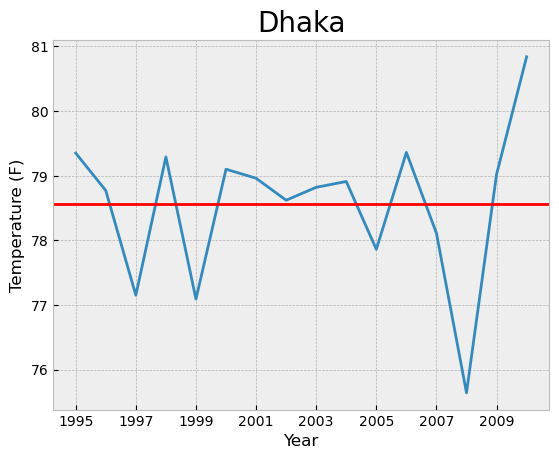

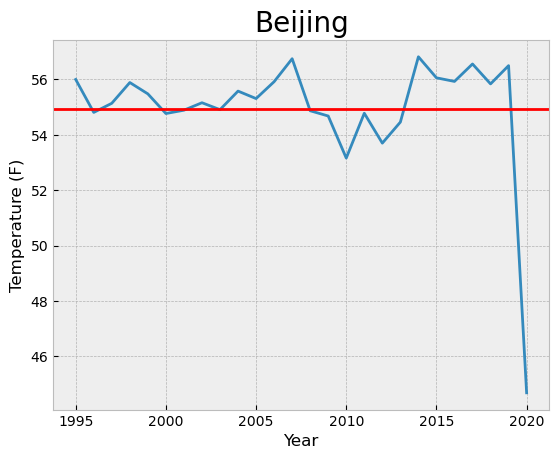

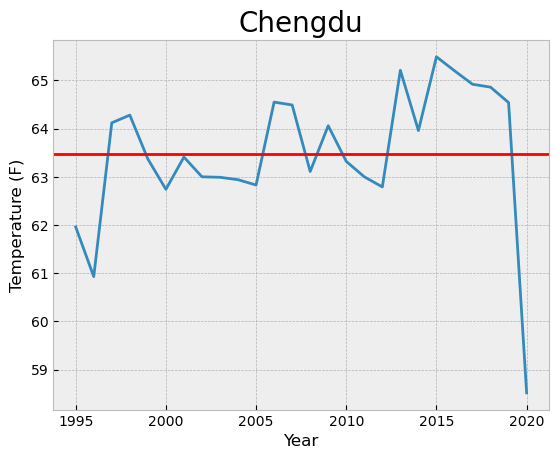

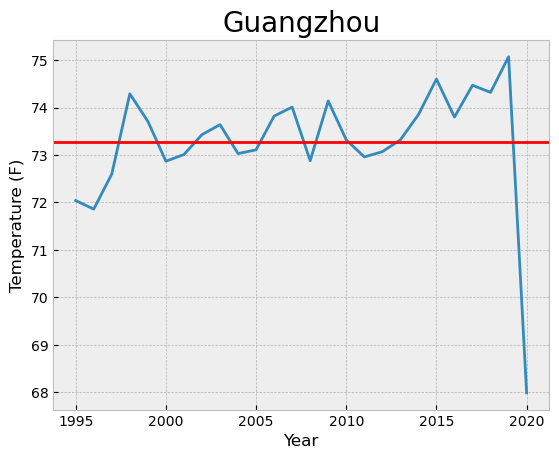

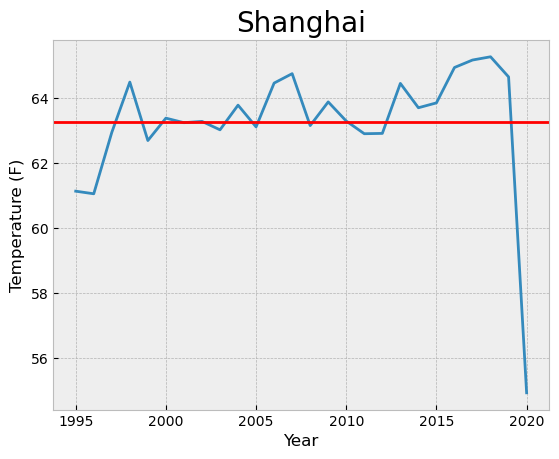

...

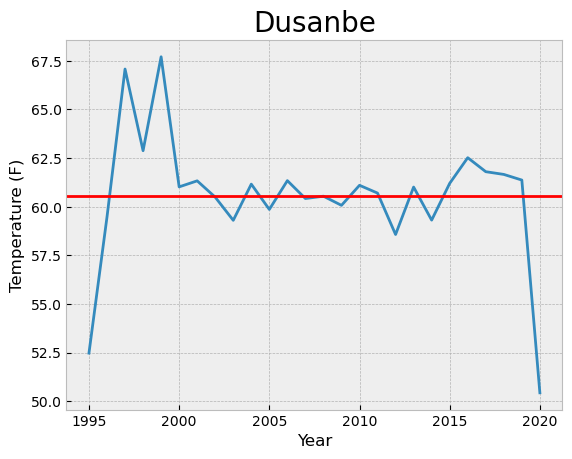

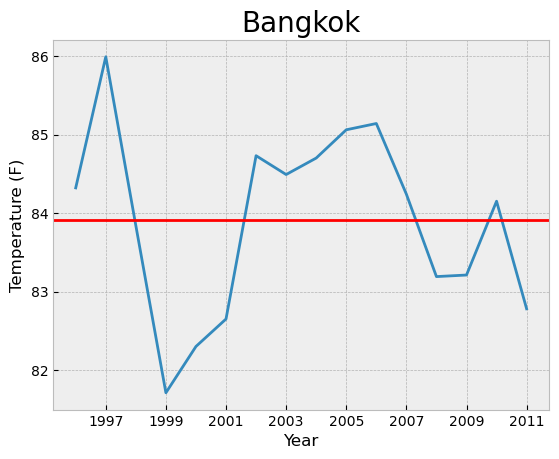

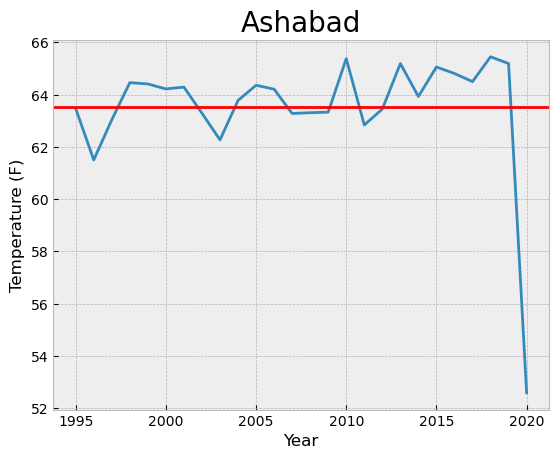

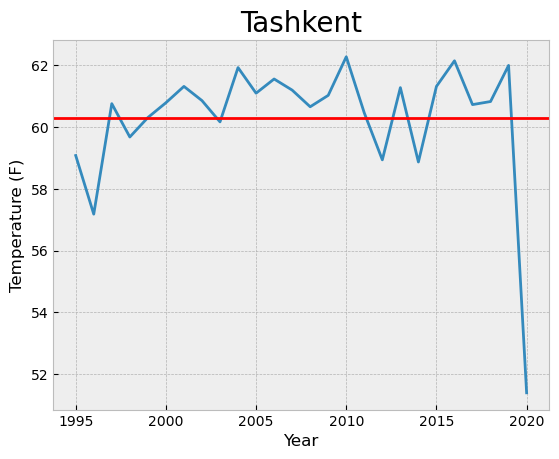

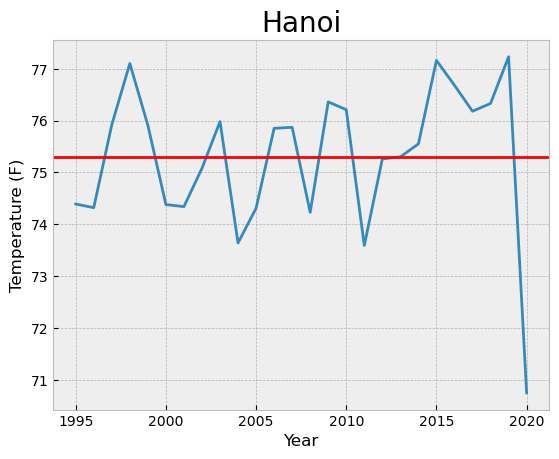

In [13]:
#DO NOT RUN AGAIN
#Save the Images for each specific City - Fahrenheit
for column in asia_mean_f_df.columns[1:]:
    plt.style.use("bmh")
    asia_mean_f_df.plot(x = "Year", y = column)
    plt.axhline(round(asia_mean_f_df[column].mean(),2), color = "red")
    plt.title(column, fontsize = 20)
    plt.xlabel("Year")
    plt.ylabel("Temperature (F)")
    plt.legend().remove()
    plt.savefig(f"{column}_F.png", bbox_inches = "tight")

C:\Users\Amey Joshi\.conda\envs\pandas_playground\Lib\site-packages\pandas\plotting\_matplotlib\core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


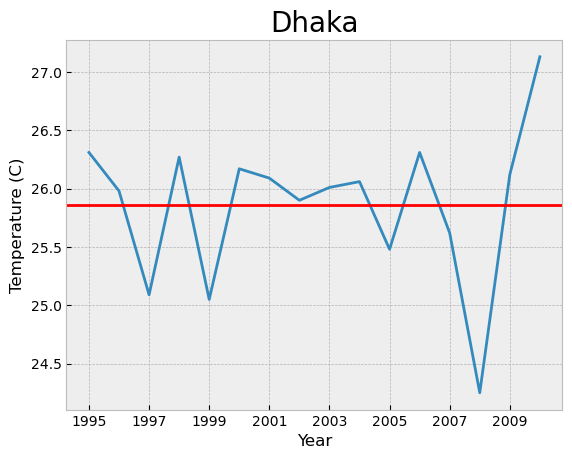

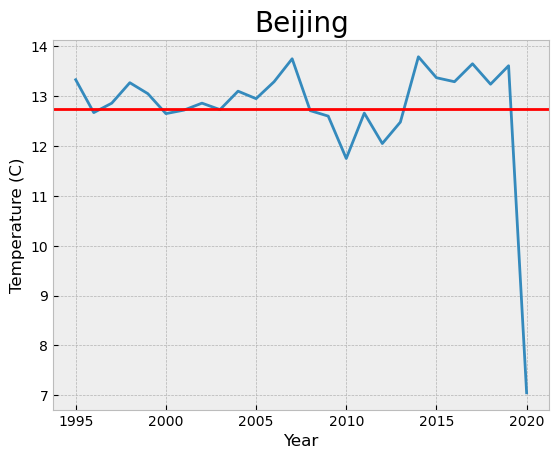

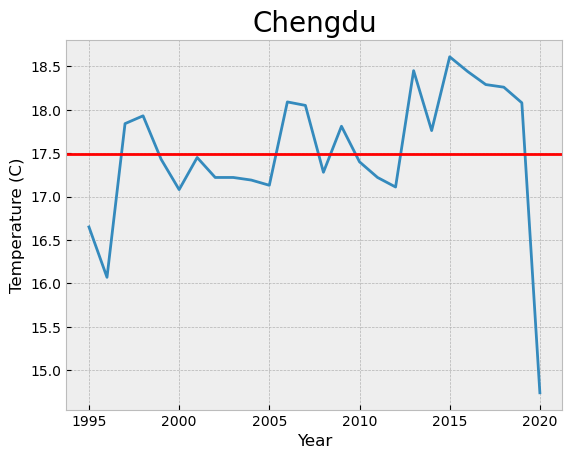

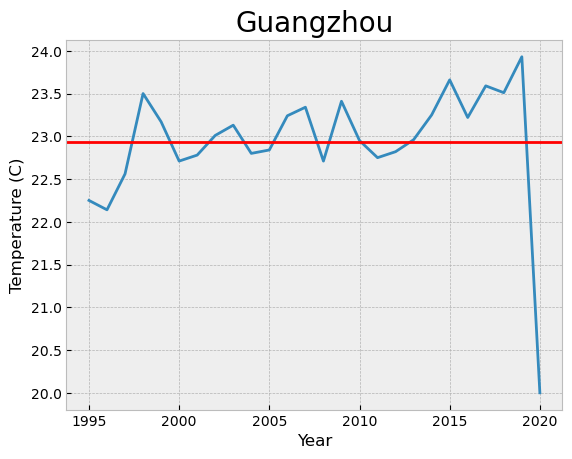

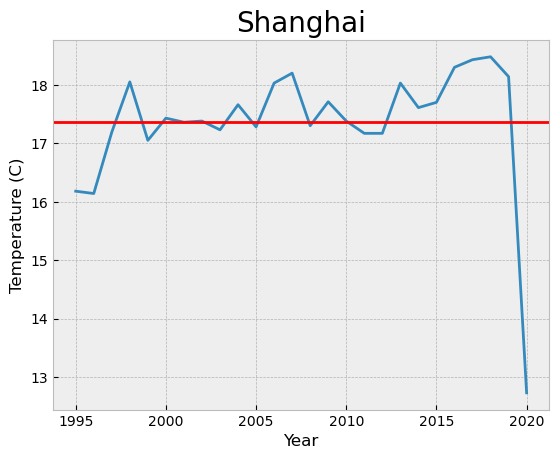

...

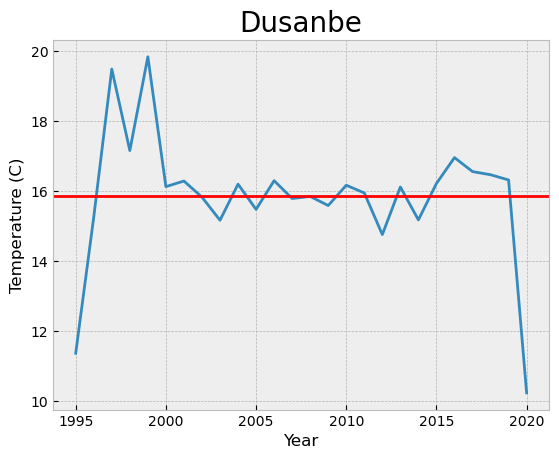

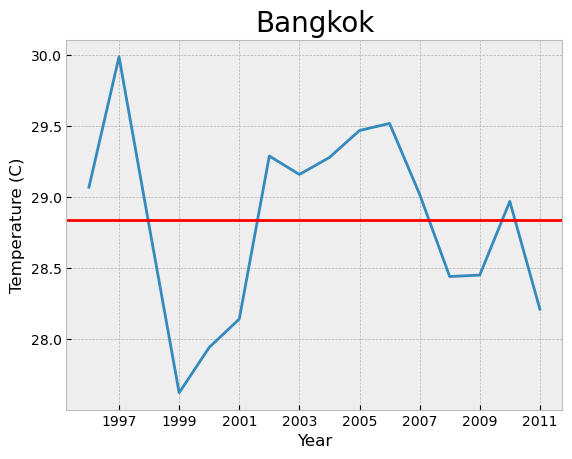

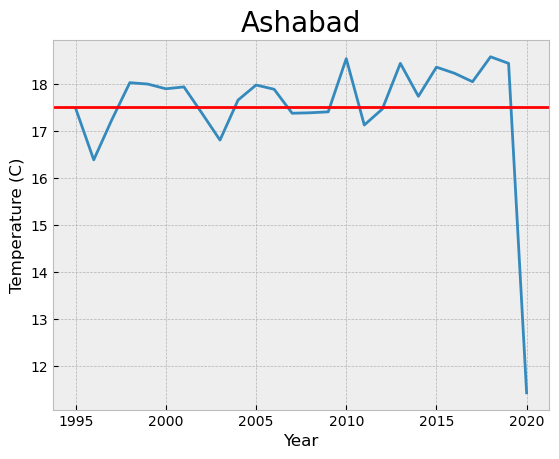

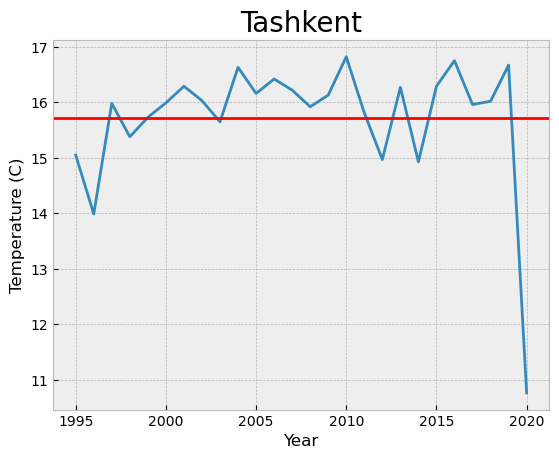

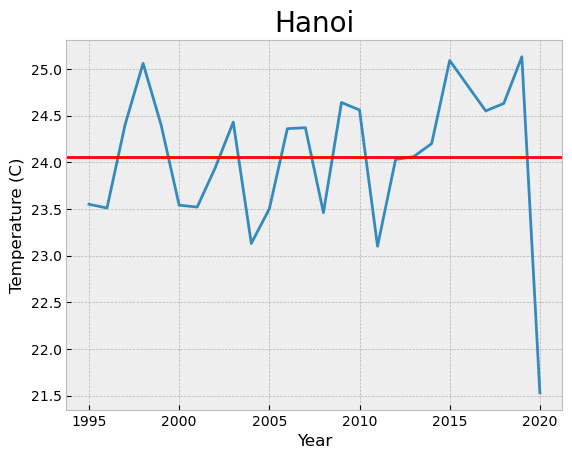

In [14]:
#DO NOT RUN AGAIN
#Save the Images for each specific Country - Celsius
for column in asia_mean_c_df.columns[1:]:
    plt.style.use("bmh")
    asia_mean_c_df.plot(x = "Year", y = column)
    plt.axhline(round(asia_mean_c_df[column].mean(),2), color = "red")
    plt.title(column, fontsize = 20)
    plt.xlabel("Year")
    plt.ylabel("Temperature (C)")
    plt.legend().remove()
    plt.savefig(f"{column}_C.png", bbox_inches = "tight")

### Cleaning and Setting Up Data - Africa

In [15]:
#Importing Data
africa_df = pd.read_csv("Africa.csv")

#Reducing the Memory Load
africa_df["Region"]         = africa_df["Region"].astype("category")
africa_df["Month"]          = africa_df["Month"].astype("category")
africa_df["Year"]           = africa_df["Year"].astype("category")
africa_df["Day"]            = africa_df["Day"].astype("category")
africa_df["Country"]        = africa_df["Country"].astype("category")

#First Glance
africa_df.head()

,Region,Country,City,Month,Day,Year,AvgTemperature_F,AvgTemperature_C
0,Africa,Algeria,Algiers,1,1,1995,64.2,17.89
1,Africa,Algeria,Algiers,1,2,1995,49.4,9.67
2,Africa,Algeria,Algiers,1,3,1995,48.8,9.33
3,Africa,Algeria,Algiers,1,4,1995,46.4,8.00
4,Africa,Algeria,Algiers,1,5,1995,47.9,8.83


In [16]:
africa_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220919 entries, 0 to 220918
Data columns (total 8 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   Region            220919 non-null  category
 1   Country           220919 non-null  category
 2   City              220919 non-null  object  
 3   Month             220919 non-null  category
 4   Day               220919 non-null  category
 5   Year              220919 non-null  category
 6   AvgTemperature_F  220919 non-null  float64 
 7   AvgTemperature_C  220919 non-null  float64 
dtypes: category(5), float64(2), object(1)
memory usage: 6.1+ MB


In [17]:
#Guage the Total Satisfaction Level
year = []
leap_counter = 0

for i in range(1995,2021):
    year.append(i)
    
for i in year:
    if (i%4 == 0) and (i%100 != 0):
        leap_counter += 1
    elif (i%100 == 0) and (i%400 == 0):
        leap_counter += 1

total_days         = leap_counter*366 + (len(year)-leap_counter)*365
total_entries      = total_days * 29
recd_entries       = africa_df.shape[0]
gap                = total_entries - 220919
data_efficiency    = round((gap/total_entries),2)

print(f'The total entries should be {total_entries}.')
print(f'The total entries recieved are {recd_entries}.')
print(f'The total gap in entries is {gap}.')

if data_efficiency < 0.075:
    print(f"Excellent Satisfaction Level. The Satisfaction Level is {data_efficiency}.")
elif 0.075 < data_efficiency <= 0.2:
    print(f"Satisfactory Satisfaction Level. The Satisfaction Level is {data_efficiency}.")
else:
    print(f"Satisfaction Level not met. The Satisfaction Level is {data_efficiency}.")

The total entries should be 275413.
The total entries recieved are 220919.
The total gap in entries is 54494.
Satisfactory Satisfaction Level. The Satisfaction Level is 0.2.


#### Country Wise Yearly Mean Temperature

In [18]:
#Create a List of City
africa_city_list = africa_df["City"].drop_duplicates().tolist()

#Create a List of Years
year = []
for i in range(1995,2021):
    year.append(i)

In [19]:
#Create a Dictionary for a Region - Fahrenheit
africa_parent_dict_f = {}

for i in africa_city_list:
    mydict = {}
    for j in year:
        x = round(africa_df[(africa_df["Year"] == j) & (africa_df["City"] == i)]["AvgTemperature_F"].mean(),2)
        mydict[j] = x
    africa_parent_dict_f[i] = mydict

#Create a Dictionary for a Region - Celsius
africa_parent_dict_c = {}

for i in africa_city_list:
    mydict = {}
    for j in year:
        x = round(africa_df[(africa_df["Year"] == j) & (africa_df["City"] == i)]["AvgTemperature_C"].mean(),2)
        mydict[j] = x
    africa_parent_dict_c[i] = mydict

print(africa_parent_dict_f)
print(africa_parent_dict_c)

{'Algiers': {1995: 64.41, 1996: 63.53, 1997: 64.93, 1998: 63.62, 1999: 64.92, 2000: 64.18, 2001: 64.67, 2002: 64.14, 2003: 65.49, 2004: 64.09, 2005: 62.91, 2006: 64.93, 2007: 63.61, 2008: 63.98, 2009: 64.71, 2010: 64.27, 2011: 64.96, 2012: 64.29, 2013: 63.7, 2014: 65.65, 2015: 64.94, 2016: 65.31, 2017: 65.0, 2018: 64.42, 2019: 64.99, 2020: 58.03}, 'Bujumbura': {1995: 79.33, 1996: 79.21, 1997: 78.43, 1998: 82.4, 1999: 77.4, 2000: nan, 2001: nan, 2002: nan, 2003: 81.3, 2004: 76.61, 2005: 74.05, 2006: 59.99, 2007: 54.53, 2008: nan, 2009: nan, 2010: nan, 2011: nan, 2012: nan, 2013: nan, 2014: nan, 2015: nan, 2016: nan, 2017: nan, 2018: nan, 2019: nan, 2020: nan}, 'Cotonou': {1995: 81.68, 1996: 81.44, 1997: 80.91, 1998: 82.3, 1999: 81.27, 2000: 81.9, 2001: 81.54, 2002: 81.39, 2003: 81.84, 2004: 81.28, 2005: 81.57, 2006: 82.09, 2007: 81.23, 2008: 81.2, 2009: 81.53, 2010: 82.56, 2011: 81.47, 2012: 81.21, 2013: 81.6, 2014: 81.63, 2015: 81.56, 2016: 82.18, 2017: 82.15, 2018: 82.21, 2019: 82.41,

In [20]:
#Create a Database for Year v City
#Fahrenheit
africa_mean_f_df = pd.DataFrame.from_dict(africa_parent_dict_f)

#Celsius
africa_mean_c_df = pd.DataFrame.from_dict(africa_parent_dict_c)

In [21]:
#DO NOT RUN AGAIN
#Adding Year column as String
#Fahrenheit
africa_mean_f_df.insert(0, "Year", africa_mean_f_df.index)
africa_mean_f_df["Year"] = africa_mean_f_df["Year"].astype(str)

#Celsius
africa_mean_c_df.insert(0, "Year", africa_mean_c_df.index)
africa_mean_c_df["Year"] = africa_mean_c_df["Year"].astype(str)

C:\Users\Amey Joshi\.conda\envs\pandas_playground\Lib\site-packages\pandas\plotting\_matplotlib\core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


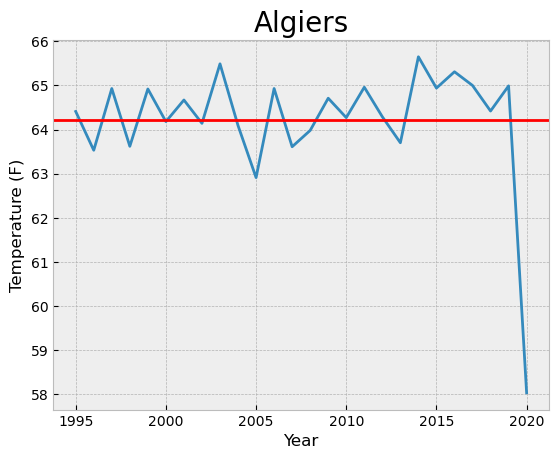

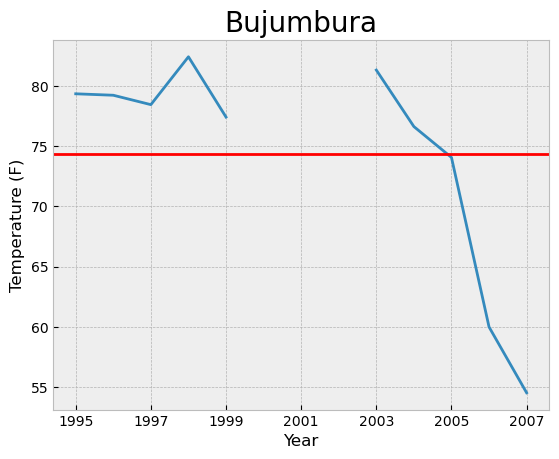

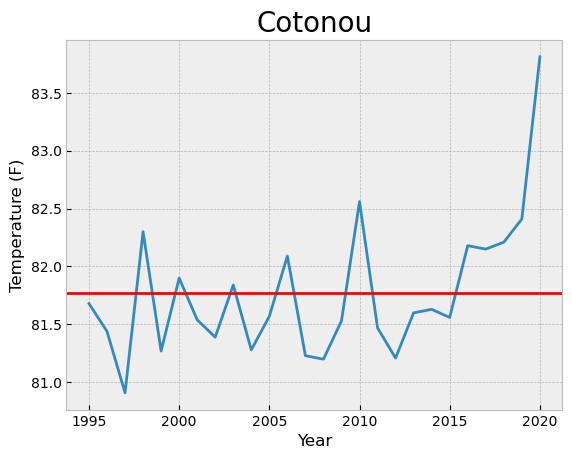

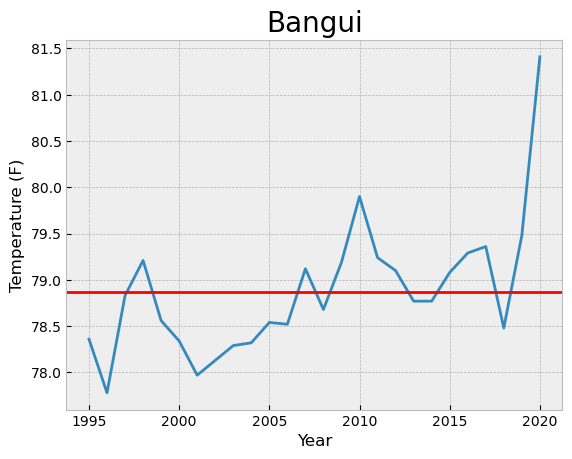

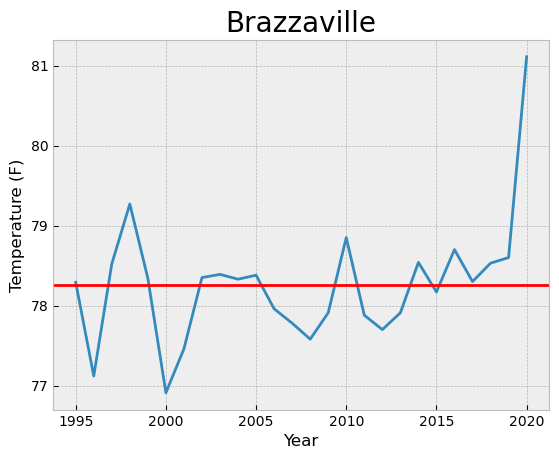

...

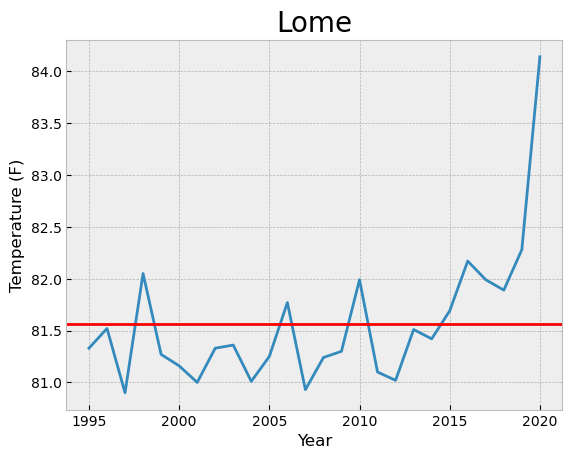

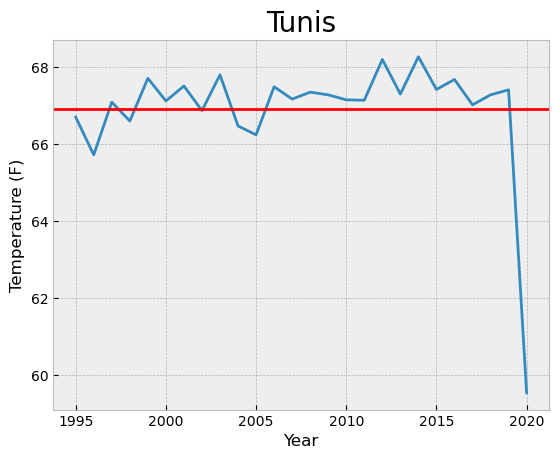

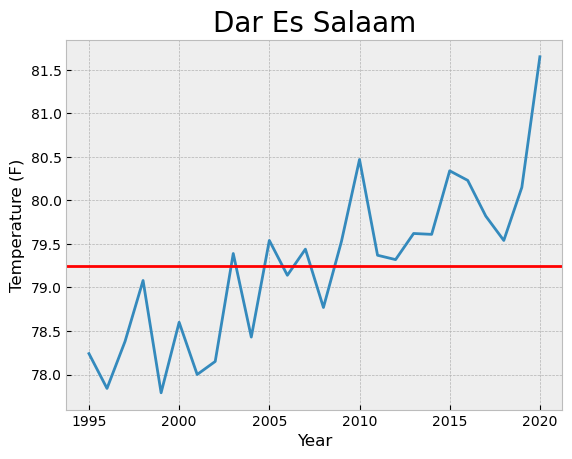

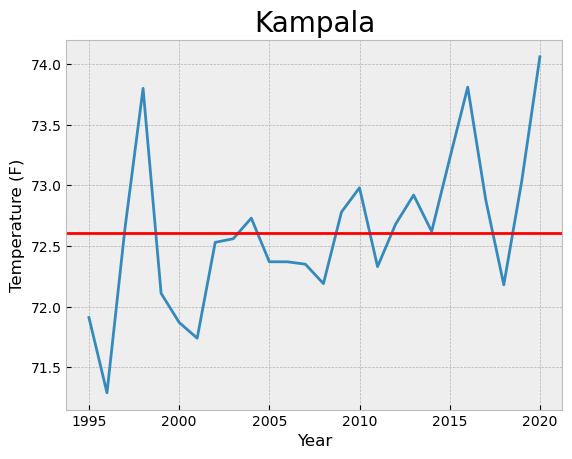

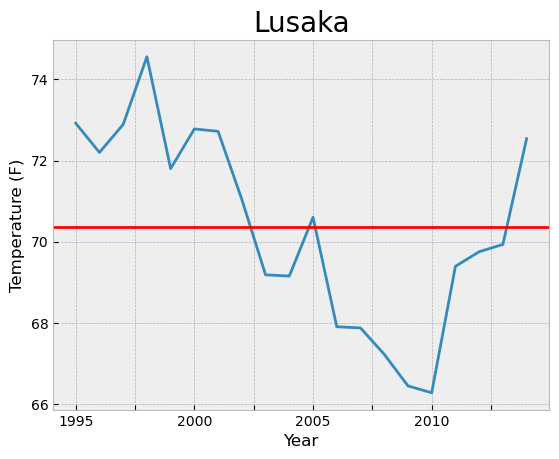

In [22]:
#DO NOT RUN AGAIN
#Save the Images for each specific City - Fahrenheit
for column in africa_mean_f_df.columns[1:]:
    plt.style.use("bmh")
    africa_mean_f_df.plot(x = "Year", y = column)
    plt.axhline(round(africa_mean_f_df[column].mean(),2), color = "red")
    plt.title(column, fontsize = 20)
    plt.xlabel("Year")
    plt.ylabel("Temperature (F)")
    plt.legend().remove()
    plt.savefig(f"{column}_F.png", bbox_inches = "tight")

C:\Users\Amey Joshi\.conda\envs\pandas_playground\Lib\site-packages\pandas\plotting\_matplotlib\core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


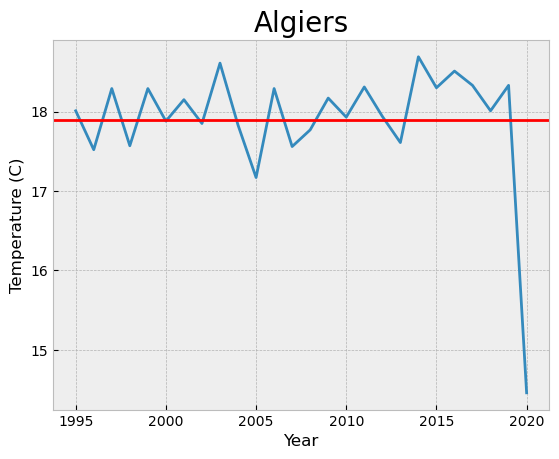

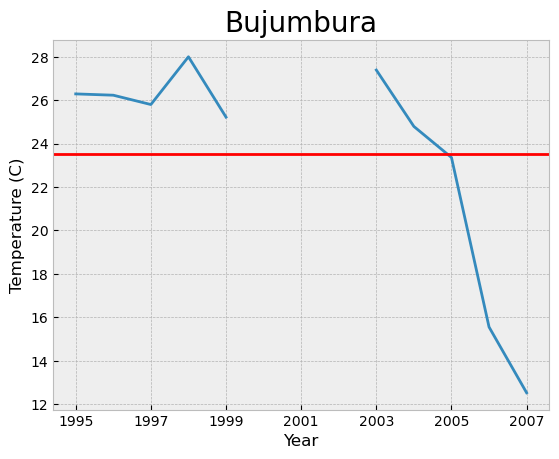

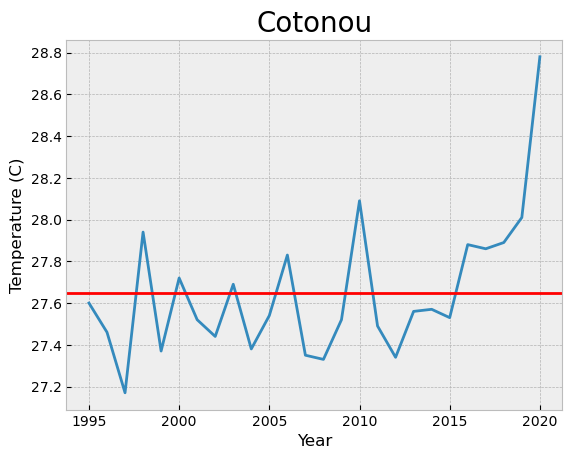

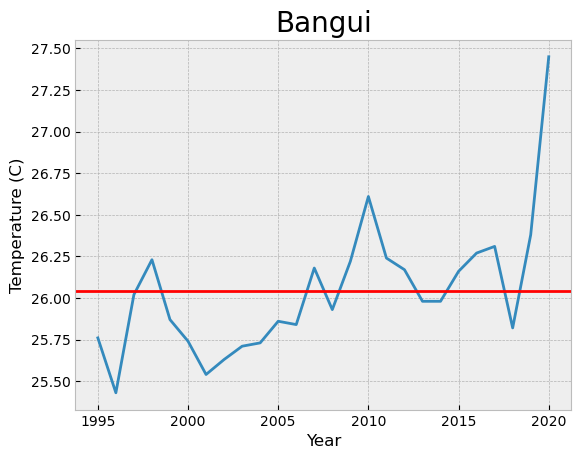

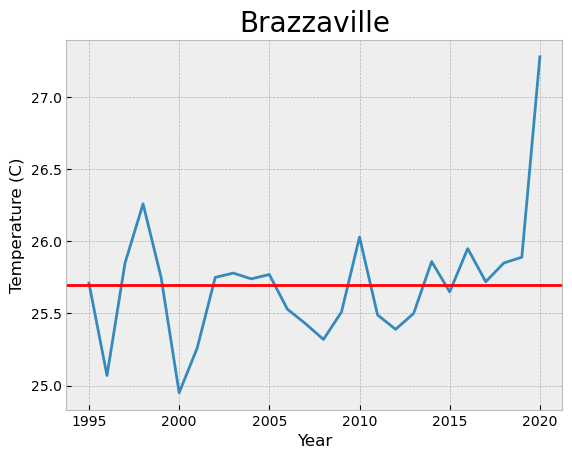

...

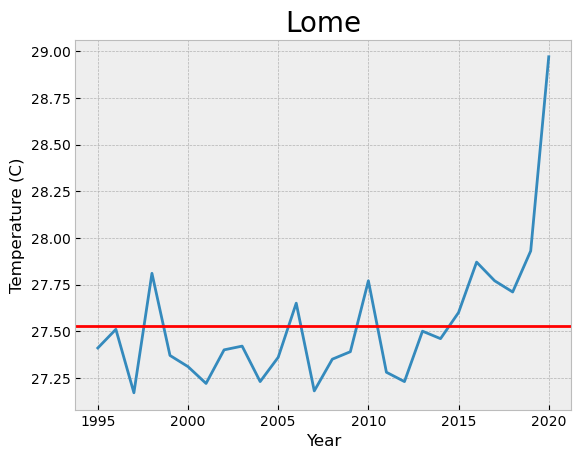

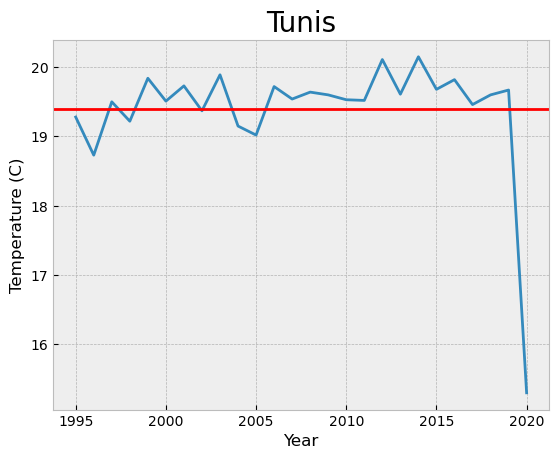

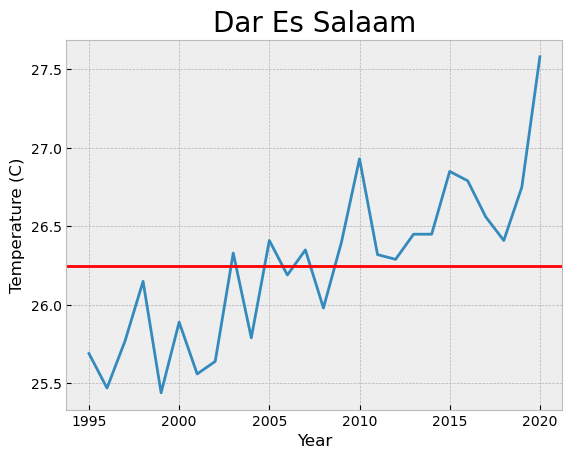

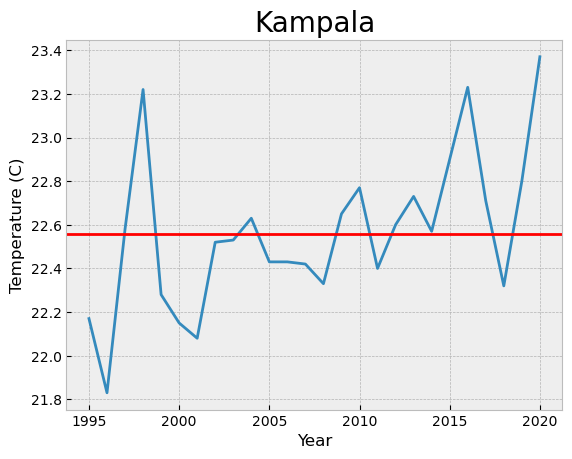

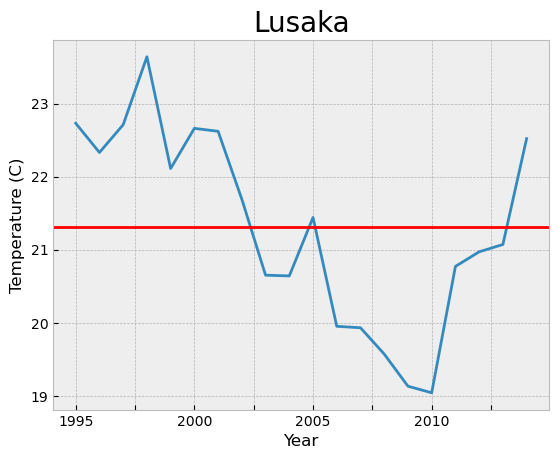

In [23]:
#DO NOT RUN AGAIN
#Save the Images for each specific City - Fahrenheit
for column in africa_mean_c_df.columns[1:]:
    plt.style.use("bmh")
    africa_mean_c_df.plot(x = "Year", y = column)
    plt.axhline(round(africa_mean_c_df[column].mean(),2), color = "red")
    plt.title(column, fontsize = 20)
    plt.xlabel("Year")
    plt.ylabel("Temperature (C)")
    plt.legend().remove()
    plt.savefig(f"{column}_C.png", bbox_inches = "tight")

### Cleaning and Setting Up Data - Australia/South Pacific

In [24]:
#Importing Data
australia_df = pd.read_csv("Australia_SouthPacific.csv")

#Reducing the Memory Load
australia_df["Region"]  = australia_df["Region"].astype("category")
australia_df["Month"]   = australia_df["Month"].astype("category")
australia_df["Year"]    = australia_df["Year"].astype("category")
australia_df["Day"]     = australia_df["Day"].astype("category")
australia_df["Country"] = australia_df["Country"].astype("category")

#First Glance
australia_df.head()

,Region,Country,City,Month,Day,Year,AvgTemperature_F,AvgTemperature_C
0,Australia/South Pacific,Australia,Brisbane,1,1,1995,76.1,24.50
1,Australia/South Pacific,Australia,Brisbane,1,2,1995,78.3,25.72
2,Australia/South Pacific,Australia,Brisbane,1,3,1995,78.6,25.89
3,Australia/South Pacific,Australia,Brisbane,1,4,1995,78.6,25.89
4,Australia/South Pacific,Australia,Brisbane,1,5,1995,78.3,25.72


In [25]:
australia_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55209 entries, 0 to 55208
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Region            55209 non-null  category
 1   Country           55209 non-null  category
 2   City              55209 non-null  object  
 3   Month             55209 non-null  category
 4   Day               55209 non-null  category
 5   Year              55209 non-null  category
 6   AvgTemperature_F  55209 non-null  float64 
 7   AvgTemperature_C  55209 non-null  float64 
dtypes: category(5), float64(2), object(1)
memory usage: 1.5+ MB


In [27]:
#Guage the Total Satisfaction Level
year = []
leap_counter = 0

for i in range(1995,2021):
    year.append(i)
    
for i in year:
    if (i%4 == 0) and (i%100 != 0):
        leap_counter += 1
    elif (i%100 == 0) and (i%400 == 0):
        leap_counter += 1

total_days         = leap_counter*366 + (len(year)-leap_counter)*365
total_entries      = total_days * 6
recd_entries       = australia_df.shape[0]
gap                = total_entries - 55209
data_efficiency    = round((gap/total_entries),2)

print(f'The total entries should be {total_entries}.')
print(f'The total entries recieved are {recd_entries}.')
print(f'The total gap in entries is {gap}.')

if data_efficiency < 0.075:
    print(f"Excellent Satisfaction Level. The Satisfaction Level is {data_efficiency}.")
elif 0.075 < data_efficiency <= 0.15:
    print(f"Satisfactory Satisfaction Level. The Satisfaction Level is {data_efficiency}.")
else:
    print(f"Satisfaction Level not met. The Satisfaction Level is {data_efficiency}.")

The total entries should be 56982.
The total entries recieved are 55209.
The total gap in entries is 1773.
Excellent Satisfaction Level. The Satisfaction Level is 0.03.


#### Country Wise Yearly Mean Temperature

In [28]:
#Create a List of Cities
australia_city_list = australia_df["City"].drop_duplicates().tolist()

#Create a List of Years
year = []
for i in range(1995,2021):
    year.append(i)

In [29]:
#Create a Dictionary for a Region - Fahrenheit
australia_parent_dict_f = {}

for i in australia_city_list:
    mydict = {}
    for j in year:
        x = round(australia_df[(australia_df["Year"] == j) & (australia_df["City"] == i)]["AvgTemperature_F"].mean(),2)
        mydict[j] = x
    australia_parent_dict_f[i] = mydict

#Create a Dictionary for a Region - Celsius
australia_parent_dict_c = {}

for i in australia_city_list:
    mydict = {}
    for j in year:
        x = round(australia_df[(australia_df["Year"] == j) & (australia_df["City"] == i)]["AvgTemperature_C"].mean(),2)
        mydict[j] = x
    australia_parent_dict_c[i] = mydict

print(australia_parent_dict_f)
print(australia_parent_dict_c)

{'Brisbane': {1995: 67.84, 1996: 67.69, 1997: 67.85, 1998: 69.03, 1999: 67.4, 2000: 67.74, 2001: 68.47, 2002: 68.68, 2003: 67.94, 2004: 68.62, 2005: 69.19, 2006: 68.55, 2007: 68.94, 2008: 67.87, 2009: 69.32, 2010: 68.67, 2011: 67.78, 2012: 68.17, 2013: 68.99, 2014: 69.45, 2015: 68.9, 2016: 69.93, 2017: 70.04, 2018: 69.11, 2019: 69.78, 2020: 74.66}, 'Canberra': {1995: 55.39, 1996: 54.02, 1997: 55.8, 1998: 55.27, 1999: 56.57, 2000: 55.45, 2001: 56.14, 2002: 56.98, 2003: 56.76, 2004: 56.84, 2005: 56.65, 2006: 57.12, 2007: 57.74, 2008: 56.09, 2009: 57.66, 2010: 55.98, 2011: 55.11, 2012: 54.42, 2013: 56.45, 2014: 56.62, 2015: 55.9, 2016: 57.19, 2017: 56.42, 2018: 57.08, 2019: 57.84, 2020: 63.37}, 'Melbourne': {1995: 63.3, 1996: 63.63, 1997: 64.43, 1998: 65.23, 1999: 64.67, 2000: 64.76, 2001: 65.09, 2002: 65.09, 2003: 64.64, 2004: 65.21, 2005: 65.76, 2006: 65.24, 2007: 65.58, 2008: 64.29, 2009: 65.89, 2010: 65.44, 2011: 64.96, 2012: 64.79, 2013: 66.36, 2014: 66.05, 2015: 65.7, 2016: 66.76, 2

In [30]:
#Create a Database for Year v Country
#Fahrenheit
australia_mean_f_df = pd.DataFrame.from_dict(australia_parent_dict_f)

#Celsius
australia_mean_c_df = pd.DataFrame.from_dict(australia_parent_dict_c)

In [31]:
#DO NOT RUN AGAIN
#Adding Year column as String
#Fahrenheit
australia_mean_f_df.insert(0, "Year", australia_mean_f_df.index)
australia_mean_f_df["Year"] = australia_mean_f_df["Year"].astype(str)

#Celsius
australia_mean_c_df.insert(0, "Year", australia_mean_c_df.index)
australia_mean_c_df["Year"] = australia_mean_c_df["Year"].astype(str)

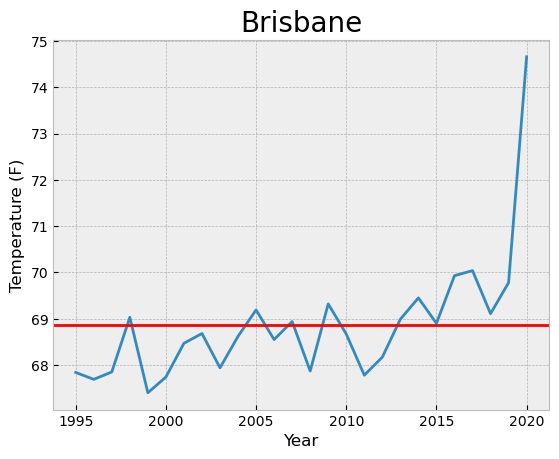

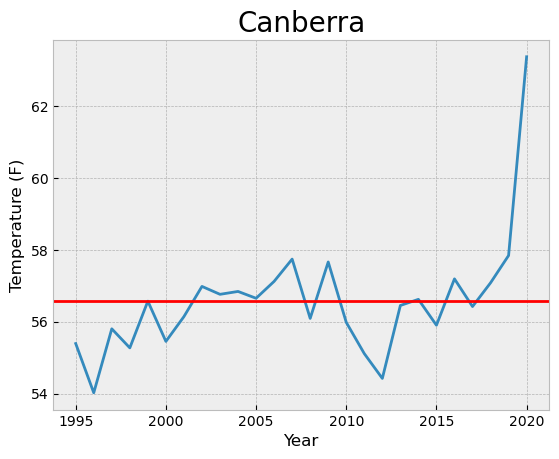

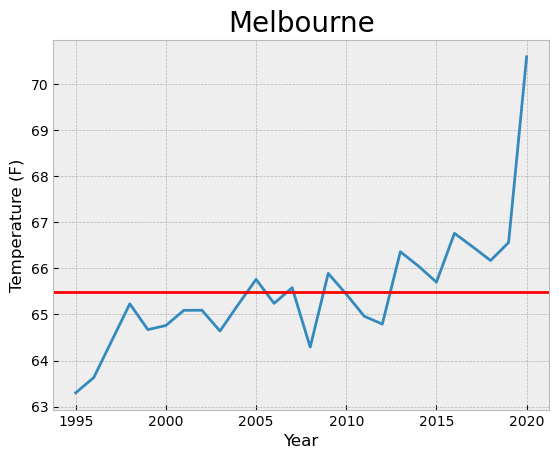

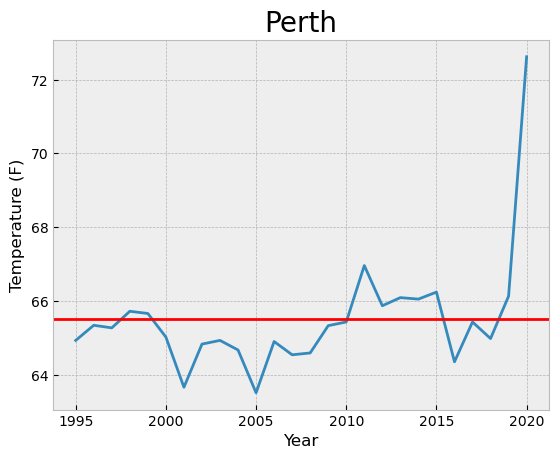

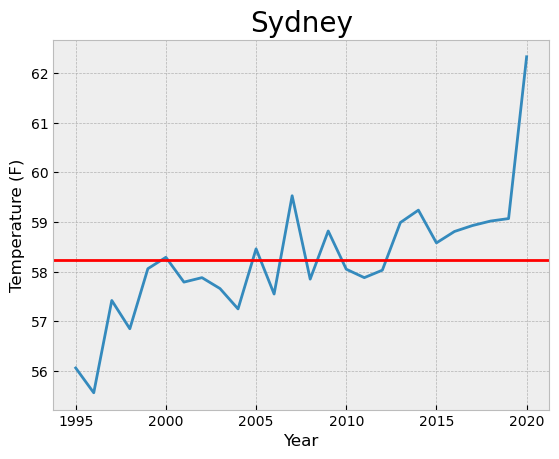

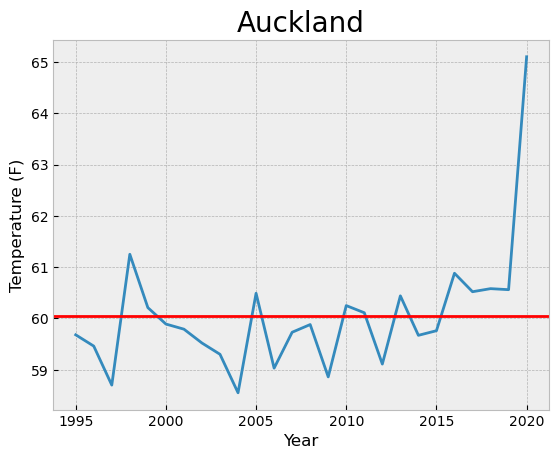

In [32]:
#DO NOT RUN AGAIN
#Save the Images for each specific City - Fahrenheit
for column in australia_mean_f_df.columns[1:]:
    plt.style.use("bmh")
    australia_mean_f_df.plot(x = "Year", y = column)
    plt.axhline(round(australia_mean_f_df[column].mean(),2), color = "red")
    plt.title(column, fontsize = 20)
    plt.xlabel("Year")
    plt.ylabel("Temperature (F)")
    plt.legend().remove()
    plt.savefig(f"{column}_F.png", bbox_inches = "tight")

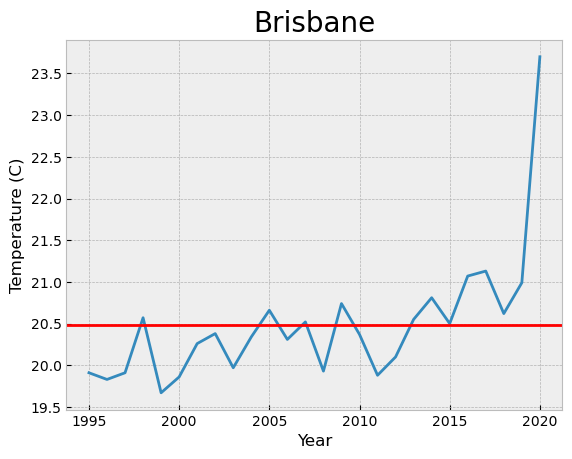

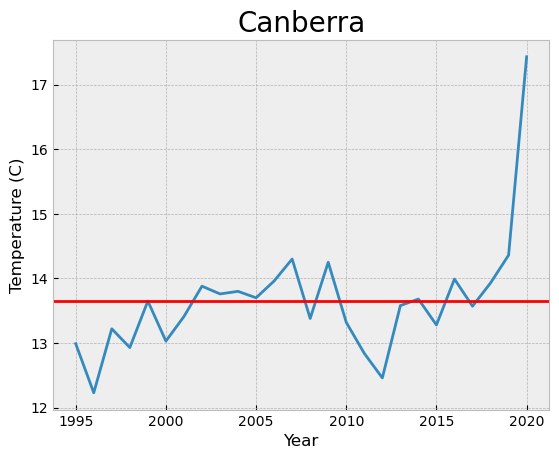

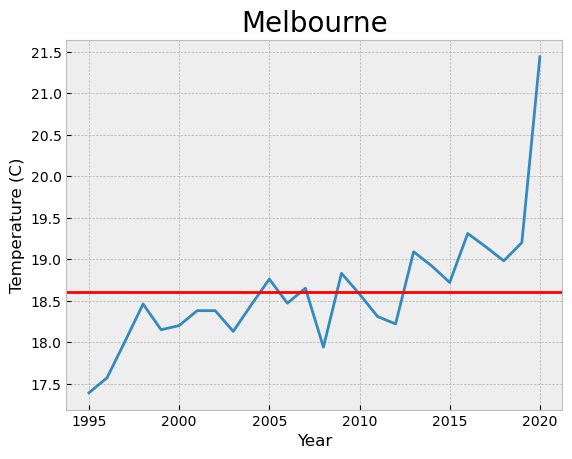

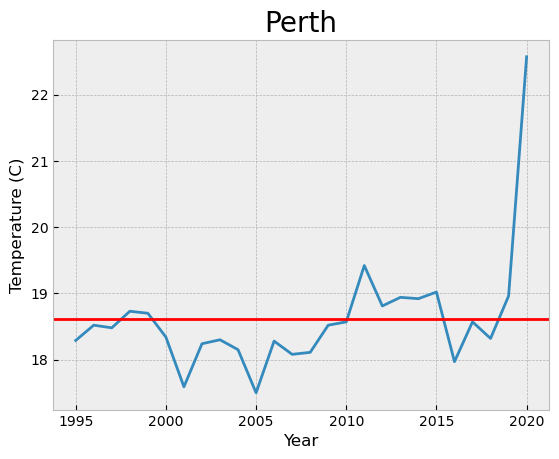

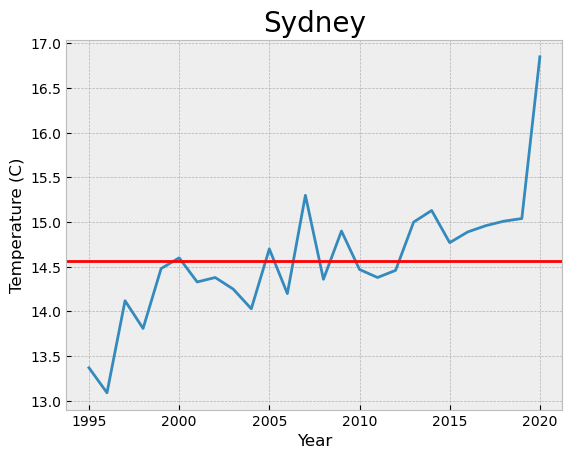

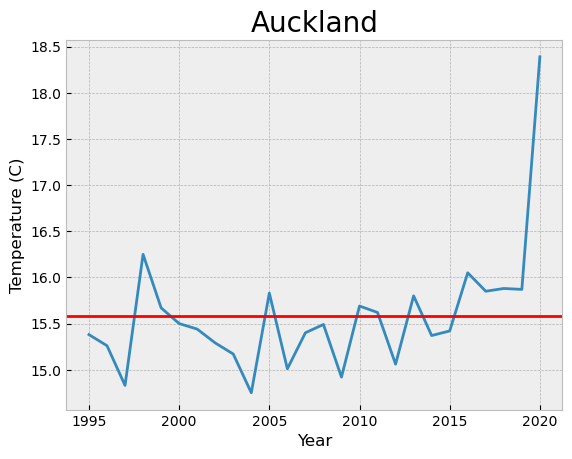

In [33]:
#DO NOT RUN AGAIN
#Save the Images for each specific City- Fahrenheit
for column in australia_mean_c_df.columns[1:]:
    plt.style.use("bmh")
    australia_mean_c_df.plot(x = "Year", y = column)
    plt.axhline(round(australia_mean_c_df[column].mean(),2), color = "red")
    plt.title(column, fontsize = 20)
    plt.xlabel("Year")
    plt.ylabel("Temperature (C)")
    plt.legend().remove()
    plt.savefig(f"{column}_C.png", bbox_inches = "tight")

### Cleaning and Setting Up Data - Europe

In [34]:
#Importing Data
europe_df = pd.read_csv("Europe.csv")

#Reducing the Memory Load
europe_df["Region"]    = europe_df["Region"].astype("category")
europe_df["Month"]     = europe_df["Month"].astype("category")
europe_df["Year"]      = europe_df["Year"].astype("category")
europe_df["Day"]       = europe_df["Day"].astype("category")
europe_df["Country"]   = europe_df["Country"].astype("category")

#First Glance
europe_df.head()

,Region,Country,City,Month,Day,Year,AvgTemperature_F,AvgTemperature_C
0,Europe,Albania,Tirana,4,21,1997,55.4,13.00
1,Europe,Albania,Tirana,4,25,1997,56.8,13.78
2,Europe,Albania,Tirana,4,26,1997,61.5,16.39
3,Europe,Albania,Tirana,4,27,1997,60.8,16.00
4,Europe,Albania,Tirana,4,28,1997,57.2,14.00


In [35]:
europe_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 368702 entries, 0 to 368701
Data columns (total 8 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   Region            368702 non-null  category
 1   Country           368702 non-null  category
 2   City              368702 non-null  object  
 3   Month             368702 non-null  category
 4   Day               368702 non-null  category
 5   Year              368702 non-null  category
 6   AvgTemperature_F  368702 non-null  float64 
 7   AvgTemperature_C  368702 non-null  float64 
dtypes: category(5), float64(2), object(1)
memory usage: 10.2+ MB


In [36]:
#Guage the Total Satisfaction Level
year = []
leap_counter = 0

for i in range(1995,2021):
    year.append(i)
    
for i in year:
    if (i%4 == 0) and (i%100 != 0):
        leap_counter += 1
    elif (i%100 == 0) and (i%400 == 0):
        leap_counter += 1

total_days         = leap_counter*366 + (len(year)-leap_counter)*365
total_entries      = total_days * 45
recd_entries       = europe_df.shape[0]
gap                = total_entries - 368702
data_efficiency    = round((gap/total_entries),2)

print(f'The total entries should be {total_entries}.')
print(f'The total entries recieved are {recd_entries}.')
print(f'The total gap in entries is {gap}.')

if data_efficiency < 0.075:
    print(f"Excellent Satisfaction Level. The Satisfaction Level is {data_efficiency}.")
elif 0.075 < data_efficiency <= 0.2:
    print(f"Satisfactory Satisfaction Level. The Satisfaction Level is {data_efficiency}.")
else:
    print(f"Satisfaction Level not met. The Satisfaction Level is {data_efficiency}.")

The total entries should be 427365.
The total entries recieved are 368702.
The total gap in entries is 58663.
Satisfactory Satisfaction Level. The Satisfaction Level is 0.14.


#### Country Wise Yearly Mean Temperature

In [37]:
#Create a List of Cities
europe_city_list = europe_df["City"].drop_duplicates().tolist()

#Create a List of Years
year = []
for i in range(1995,2021):
    year.append(i)

In [38]:
#Create a Dictionary for a Region - Fahrenheit
europe_parent_dict_f = {}

for i in europe_city_list:
    mydict = {}
    for j in year:
        x = round(europe_df[(europe_df["Year"] == j) & (europe_df["City"] == i)]["AvgTemperature_F"].mean(),2)
        mydict[j] = x
    europe_parent_dict_f[i] = mydict

#Create a Dictionary for a Region - Celsius
europe_parent_dict_c = {}

for i in europe_city_list:
    mydict = {}
    for j in year:
        x = round(europe_df[(europe_df["Year"] == j) & (europe_df["City"] == i)]["AvgTemperature_C"].mean(),2)
        mydict[j] = x
    europe_parent_dict_c[i] = mydict

print(europe_parent_dict_f)
print(europe_parent_dict_c)

{'Tirana': {1995: nan, 1996: nan, 1997: 71.93, 1998: 61.61, 1999: 63.12, 2000: 63.18, 2001: 61.24, 2002: 63.3, 2003: 63.65, 2004: 61.52, 2005: 60.81, 2006: 59.87, 2007: 61.33, 2008: 60.66, 2009: 61.16, 2010: 60.57, 2011: 59.92, 2012: 60.32, 2013: 60.41, 2014: 60.65, 2015: 60.96, 2016: 60.73, 2017: 60.38, 2018: 62.1, 2019: 61.67, 2020: 51.16}, 'Vienna': {1995: 50.25, 1996: 47.68, 1997: 49.68, 1998: 51.34, 1999: 50.96, 2000: 52.76, 2001: 50.82, 2002: 51.87, 2003: 51.5, 2004: 50.6, 2005: 50.3, 2006: 51.24, 2007: 53.01, 2008: 52.59, 2009: 51.77, 2010: 49.25, 2011: 51.28, 2012: 51.91, 2013: 51.43, 2014: 53.35, 2015: 53.47, 2016: 52.11, 2017: 52.35, 2018: 53.79, 2019: 53.91, 2020: 44.92}, 'Minsk': {1995: 44.31, 1996: 41.65, 1997: 42.97, 1998: 44.44, 1999: 46.93, 2000: 46.96, 2001: 45.37, 2002: 46.53, 2003: 44.6, 2004: 44.72, 2005: 45.14, 2006: 45.17, 2007: 46.76, 2008: 46.97, 2009: 45.02, 2010: 44.89, 2011: 46.51, 2012: 45.11, 2013: 46.32, 2014: 46.82, 2015: 48.25, 2016: 46.41, 2017: 46.1, 2

In [39]:
#Create a Database for Year v City
#Fahrenheit
europe_mean_f_df = pd.DataFrame.from_dict(europe_parent_dict_f)

#Celsius
europe_mean_c_df = pd.DataFrame.from_dict(europe_parent_dict_c)

In [40]:
#DO NOT RUN AGAIN
#Adding Year column as String
#Fahrenheit
europe_mean_f_df.insert(0, "Year", europe_mean_f_df.index)
europe_mean_f_df["Year"] = europe_mean_f_df["Year"].astype(str)

#Celsius
europe_mean_c_df.insert(0, "Year", europe_mean_c_df.index)
europe_mean_c_df["Year"] = europe_mean_c_df["Year"].astype(str)

C:\Users\Amey Joshi\.conda\envs\pandas_playground\Lib\site-packages\pandas\plotting\_matplotlib\core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


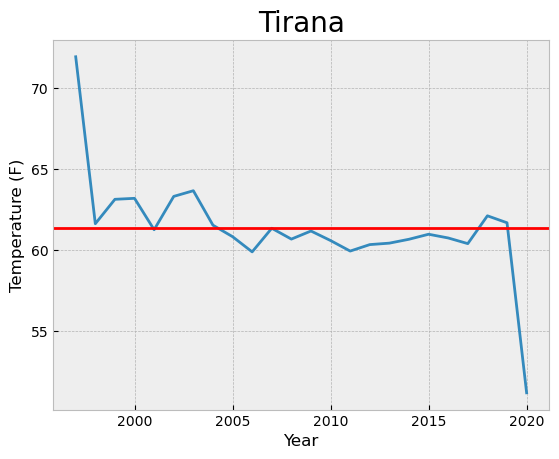

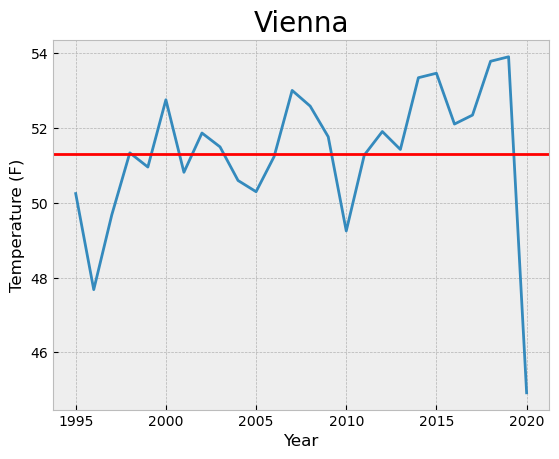

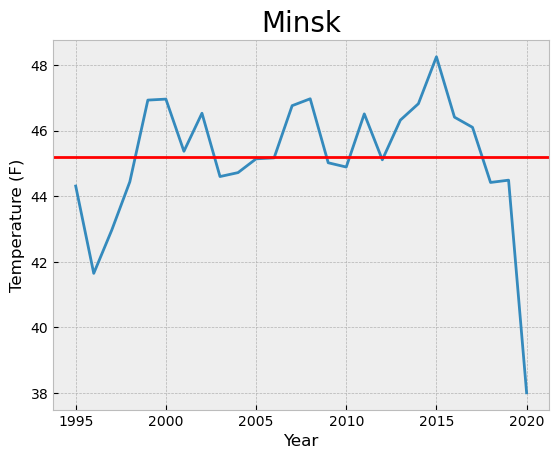

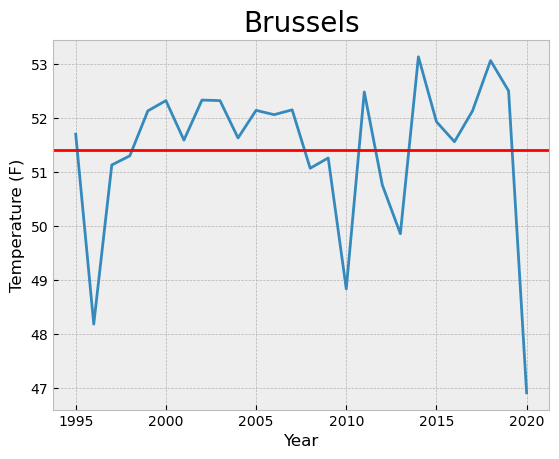

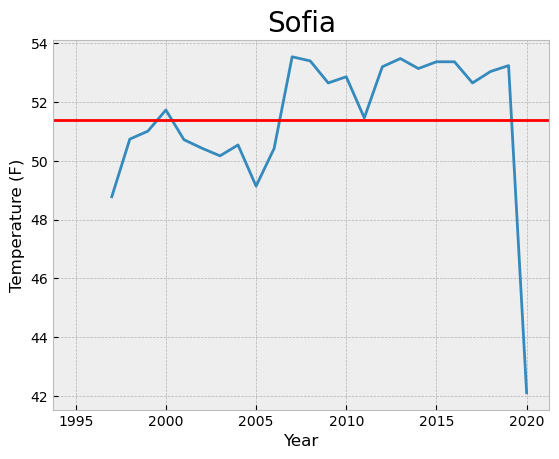

...

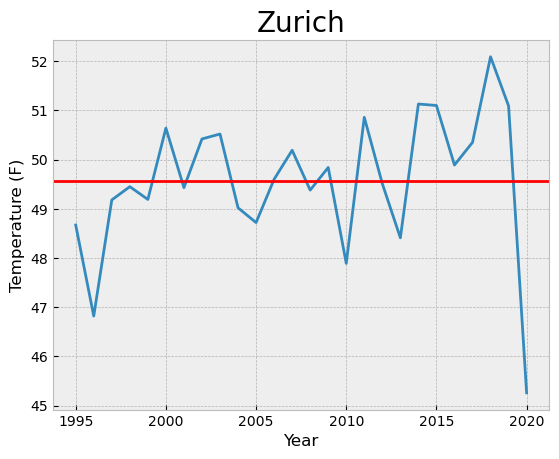

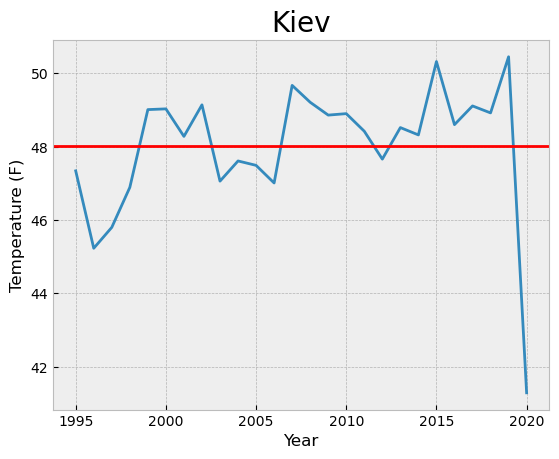

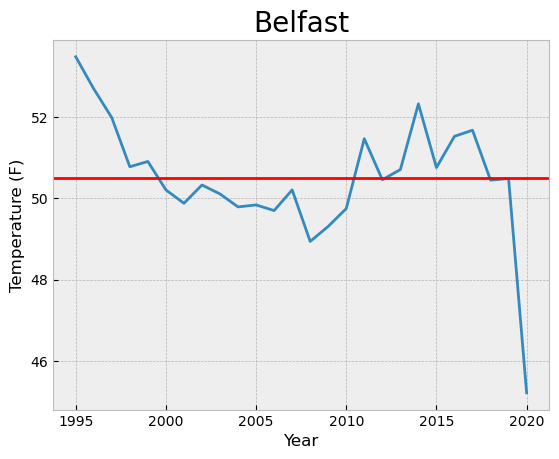

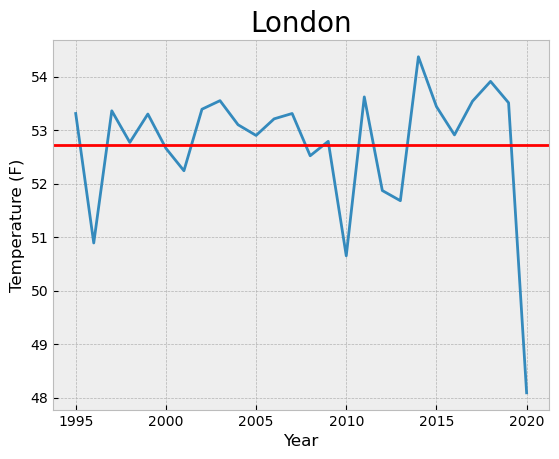

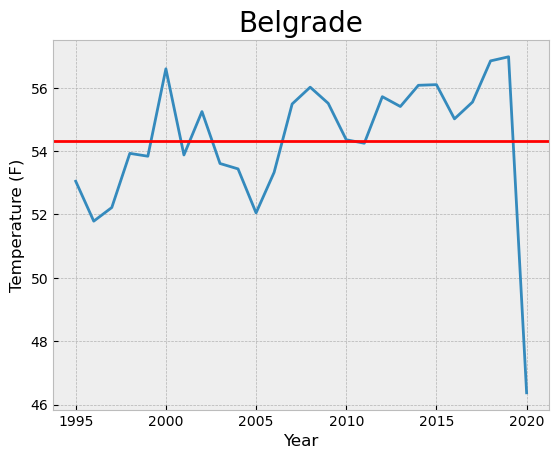

In [41]:
#DO NOT RUN AGAIN
#Save the Images for each specific City - Fahrenheit
for column in europe_mean_f_df.columns[1:]:
    plt.style.use("bmh")
    europe_mean_f_df.plot(x = "Year", y = column)
    plt.axhline(round(europe_mean_f_df[column].mean(),2), color = "red")
    plt.title(column, fontsize = 20)
    plt.xlabel("Year")
    plt.ylabel("Temperature (F)")
    plt.legend().remove()
    plt.savefig(f"{column}_F.png", bbox_inches = "tight")

C:\Users\Amey Joshi\.conda\envs\pandas_playground\Lib\site-packages\pandas\plotting\_matplotlib\core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


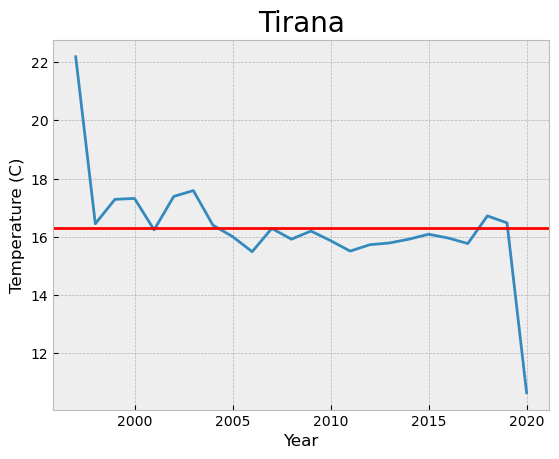

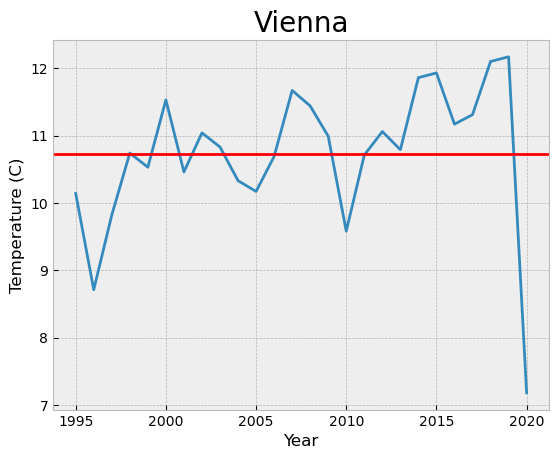

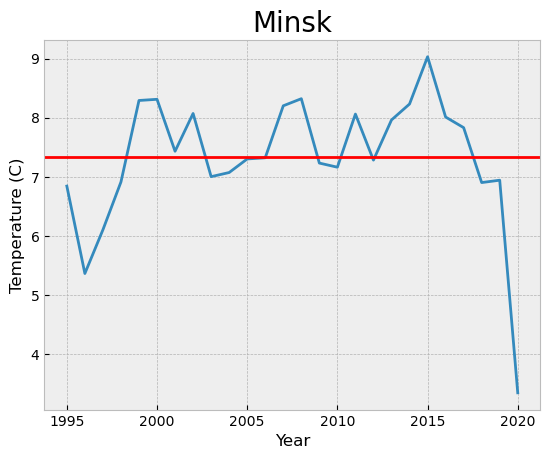

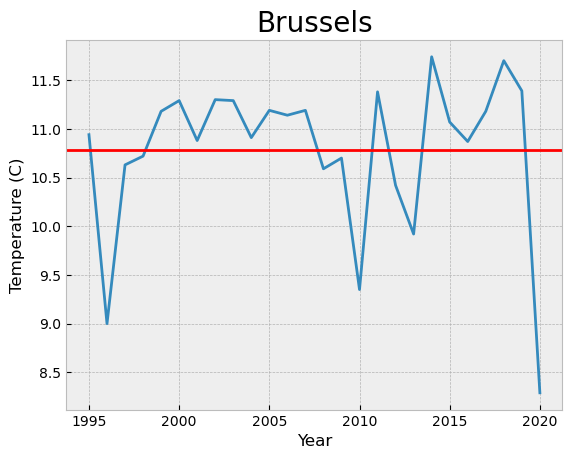

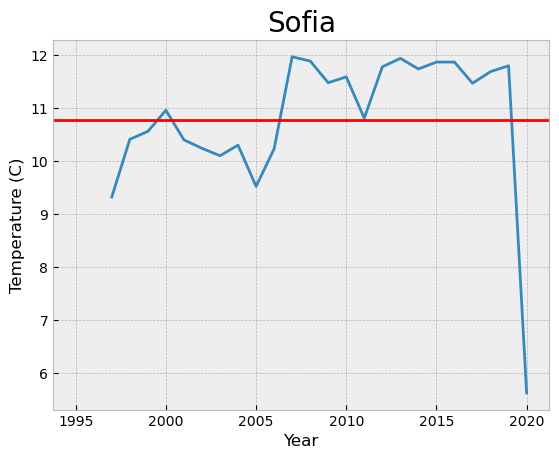

...

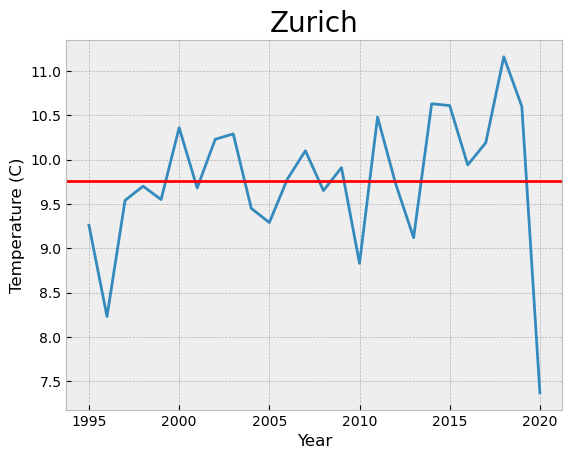

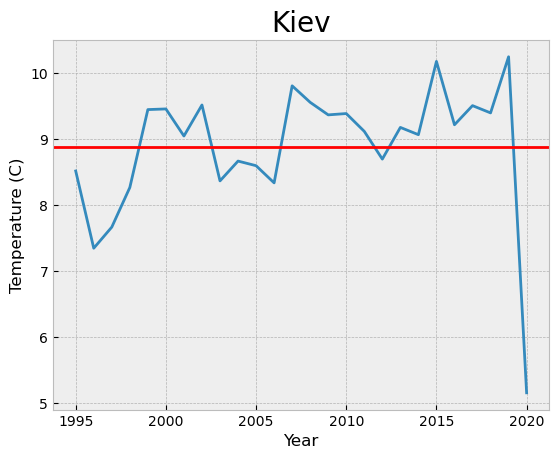

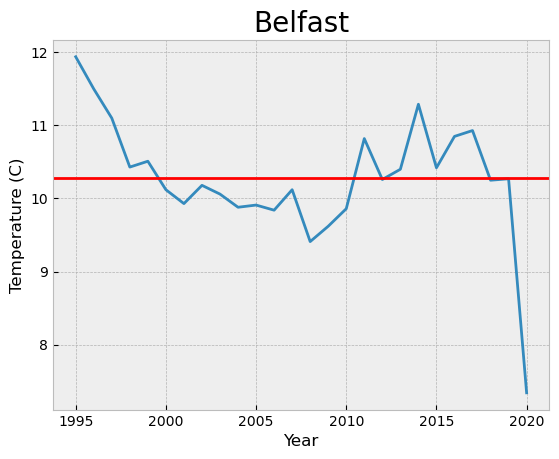

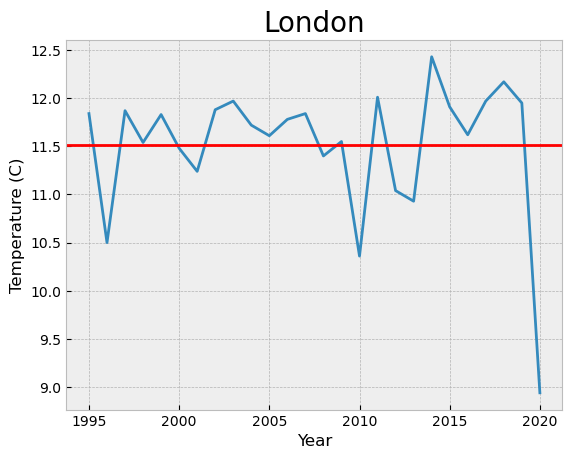

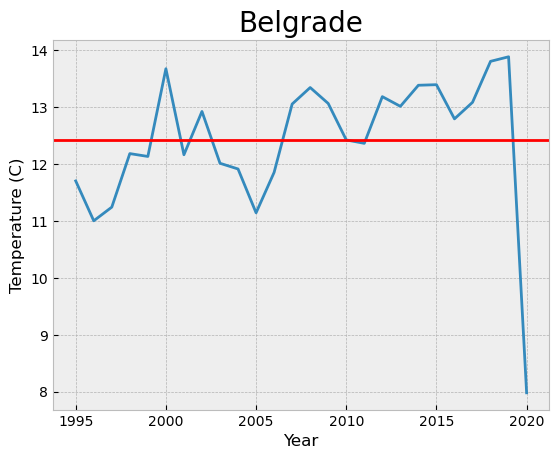

In [42]:
#DO NOT RUN AGAIN
#Save the Images for each specific City - Celsius
for column in europe_mean_c_df.columns[1:]:
    plt.style.use("bmh")
    europe_mean_c_df.plot(x = "Year", y = column)
    plt.axhline(round(europe_mean_c_df[column].mean(),2), color = "red")
    plt.title(column, fontsize = 20)
    plt.xlabel("Year")
    plt.ylabel("Temperature (C)")
    plt.legend().remove()
    plt.savefig(f"{column}_C.png", bbox_inches = "tight")

### Cleaning and Setting Up Data - Middle East

In [43]:
#Importing Data
middleeast_df = pd.read_csv("Middle_East.csv")

#Reducing the Memory Load
middleeast_df["Region"] = middleeast_df["Region"].astype("category")
middleeast_df["Month"]  = middleeast_df["Month"].astype("category")
middleeast_df["Year"]   = middleeast_df["Year"].astype("category")
middleeast_df["Day"]    = middleeast_df["Day"].astype("category")
middleeast_df["Country"]   = middleeast_df["Country"].astype("category")

#First Glance
middleeast_df.head()

,Region,Country,City,Month,Day,Year,AvgTemperature_F,AvgTemperature_C
0,Middle East,Bahrain,Manama,1,1,1995,64.0,17.78
1,Middle East,Bahrain,Manama,1,2,1995,61.8,16.56
2,Middle East,Bahrain,Manama,1,3,1995,62.1,16.72
3,Middle East,Bahrain,Manama,1,4,1995,62.4,16.89
4,Middle East,Bahrain,Manama,1,5,1995,62.4,16.89


In [44]:
middleeast_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120811 entries, 0 to 120810
Data columns (total 8 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   Region            120811 non-null  category
 1   Country           120811 non-null  category
 2   City              120811 non-null  object  
 3   Month             120811 non-null  category
 4   Day               120811 non-null  category
 5   Year              120811 non-null  category
 6   AvgTemperature_F  120811 non-null  float64 
 7   AvgTemperature_C  120811 non-null  float64 
dtypes: category(5), float64(2), object(1)
memory usage: 3.3+ MB


In [45]:
#Guage the Total Satisfaction Level
year = []
leap_counter = 0

for i in range(1995,2021):
    year.append(i)
    
for i in year:
    if (i%4 == 0) and (i%100 != 0):
        leap_counter += 1
    elif (i%100 == 0) and (i%400 == 0):
        leap_counter += 1

total_days         = leap_counter*366 + (len(year)-leap_counter)*365
total_entries      = total_days * 14
recd_entries       = middleeast_df.shape[0]
gap                = total_entries - 120811
data_efficiency    = round((gap/total_entries),2)

print(f'The total entries should be {total_entries}.')
print(f'The total entries recieved are {recd_entries}.')
print(f'The total gap in entries is {gap}.')

if data_efficiency < 0.075:
    print(f"Excellent Satisfaction Level. The Satisfaction Level is {data_efficiency}.")
elif 0.075 < data_efficiency <= 0.2:
    print(f"Satisfactory Satisfaction Level. The Satisfaction Level is {data_efficiency}.")
else:
    print(f"Satisfaction Level not met. The Satisfaction Level is {data_efficiency}.")

The total entries should be 132958.
The total entries recieved are 120811.
The total gap in entries is 12147.
Satisfactory Satisfaction Level. The Satisfaction Level is 0.09.


#### Country Wise Yearly Mean Temperature

In [46]:
#Create a List of Cities
middleeast_city_list = middleeast_df["City"].drop_duplicates().tolist()

#Create a List of Years
year = []
for i in range(1995,2021):
    year.append(i)

In [47]:
#Create a Dictionary for a Region - Fahrenheit
middleeast_parent_dict_f = {}

for i in middleeast_city_list:
    mydict = {}
    for j in year:
        x = round(middleeast_df[(middleeast_df["Year"] == j) & (middleeast_df["City"] == i)]["AvgTemperature_F"].mean(),2)
        mydict[j] = x
    middleeast_parent_dict_f[i] = mydict

#Create a Dictionary for a Region - Celsius
middleeast_parent_dict_c = {}

for i in middleeast_city_list:
    mydict = {}
    for j in year:
        x = round(middleeast_df[(middleeast_df["Year"] == j) & (middleeast_df["City"] == i)]["AvgTemperature_C"].mean(),2)
        mydict[j] = x
    middleeast_parent_dict_c[i] = mydict

print(middleeast_parent_dict_f)
print(middleeast_parent_dict_c)

{'Manama': {1995: 79.28, 1996: 80.18, 1997: 78.8, 1998: 82.2, 1999: 82.3, 2000: 80.61, 2001: 81.32, 2002: 80.87, 2003: 80.98, 2004: 80.78, 2005: 80.21, 2006: 81.01, 2007: 80.98, 2008: 80.49, 2009: 81.4, 2010: 82.93, 2011: 80.92, 2012: 81.68, 2013: 81.2, 2014: 82.07, 2015: 82.62, 2016: 82.13, 2017: 82.64, 2018: 83.3, 2019: 82.96, 2020: 72.24}, 'Tel Aviv': {1995: 68.62, 1996: 72.35, 1997: 68.48, 1998: 71.1, 1999: 70.82, 2000: 69.84, 2001: 69.89, 2002: 70.57, 2003: 69.74, 2004: 69.3, 2005: 71.2, 2006: 71.22, 2007: 70.32, 2008: nan, 2009: nan, 2010: nan, 2011: nan, 2012: nan, 2013: nan, 2014: nan, 2015: nan, 2016: nan, 2017: nan, 2018: nan, 2019: nan, 2020: nan}, 'Amman': {1995: 63.29, 1996: 64.39, 1997: 62.61, 1998: 65.46, 1999: 64.94, 2000: 63.86, 2001: 65.15, 2002: 63.95, 2003: 63.91, 2004: 64.26, 2005: 64.39, 2006: 64.27, 2007: 64.64, 2008: 65.21, 2009: 65.04, 2010: 68.18, 2011: 63.8, 2012: 65.64, 2013: 64.82, 2014: 65.45, 2015: 65.25, 2016: 65.99, 2017: 65.74, 2018: 66.63, 2019: 65.2,

In [48]:
#Create a Database for Year v City
#Fahrenheit
middleeast_mean_f_df = pd.DataFrame.from_dict(middleeast_parent_dict_f)

#Celsius
middleeast_mean_c_df = pd.DataFrame.from_dict(middleeast_parent_dict_c)

In [49]:
#DO NOT RUN AGAIN
#Adding Year column as String
#Fahrenheit
middleeast_mean_f_df.insert(0, "Year", middleeast_mean_f_df.index)
middleeast_mean_f_df["Year"] = middleeast_mean_f_df["Year"].astype(str)

#Celsius
middleeast_mean_c_df.insert(0, "Year", middleeast_mean_c_df.index)
middleeast_mean_c_df["Year"] = middleeast_mean_c_df["Year"].astype(str)

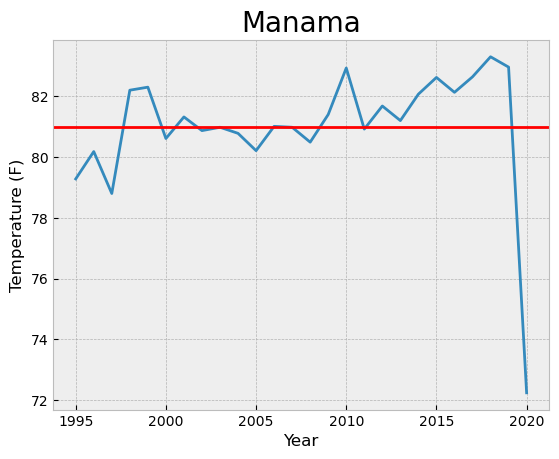

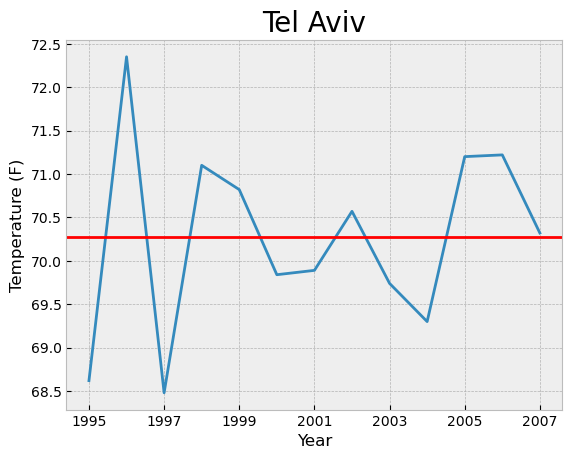

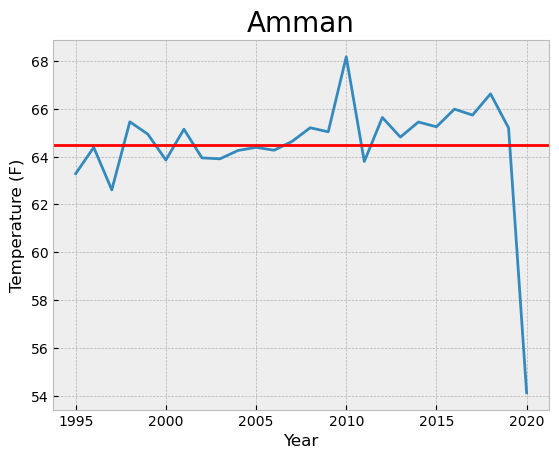

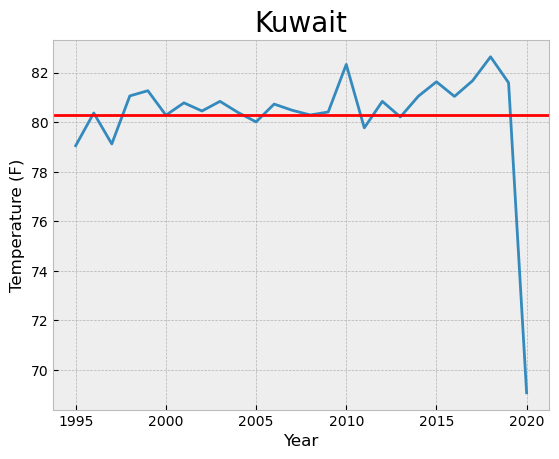

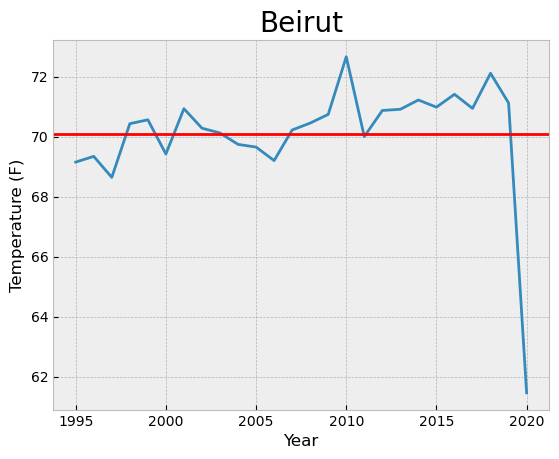

...

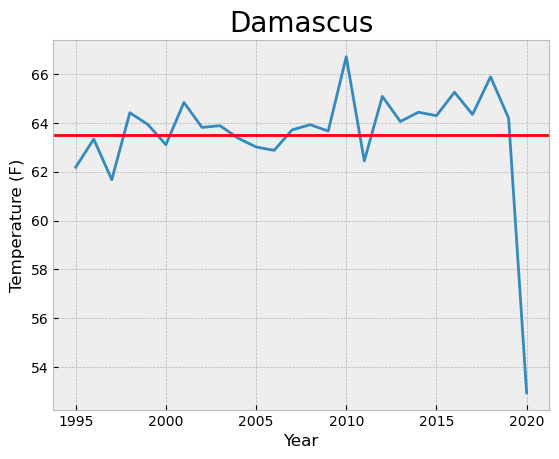

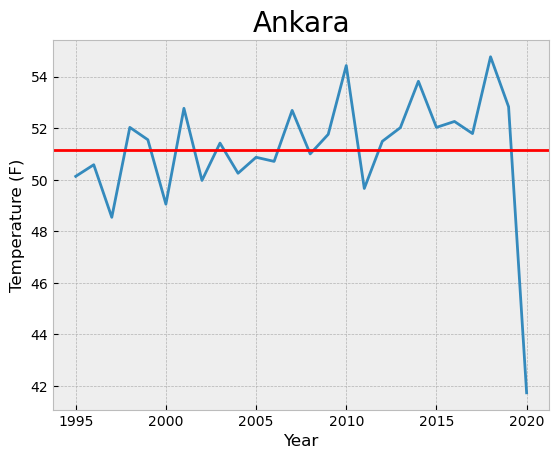

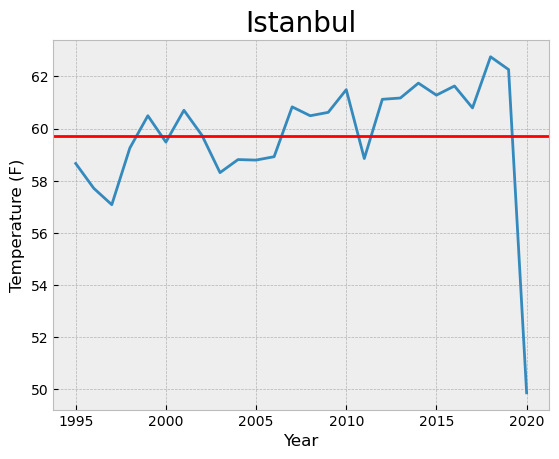

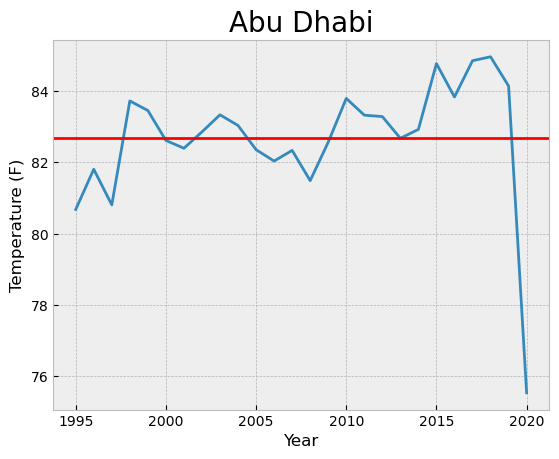

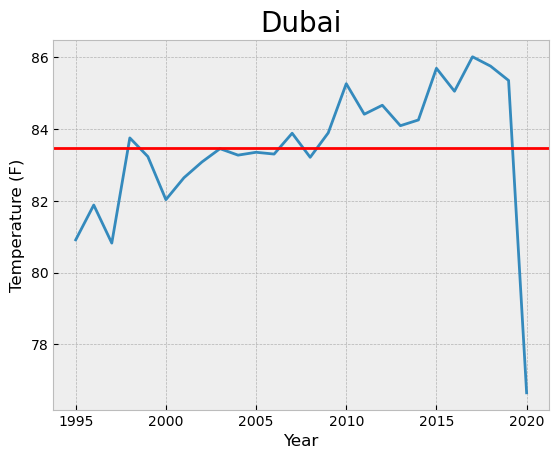

In [50]:
#DO NOT RUN AGAIN
#Save the Images for each specific City - Fahrenheit
for column in middleeast_mean_f_df.columns[1:]:
    plt.style.use("bmh")
    middleeast_mean_f_df.plot(x = "Year", y = column)
    plt.axhline(round(middleeast_mean_f_df[column].mean(),2), color = "red")
    plt.title(column, fontsize = 20)
    plt.xlabel("Year")
    plt.ylabel("Temperature (F)")
    plt.legend().remove()
    plt.savefig(f"{column}_F.png", bbox_inches = "tight")

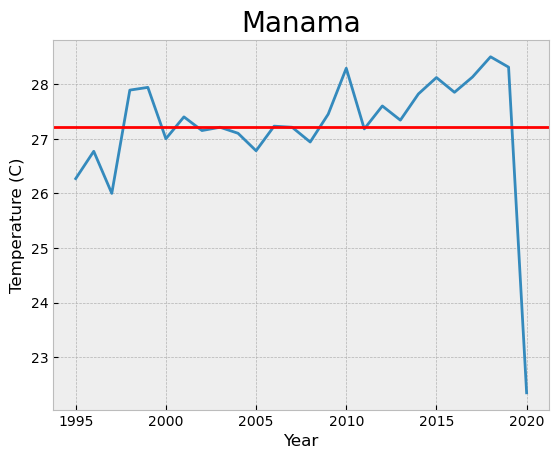

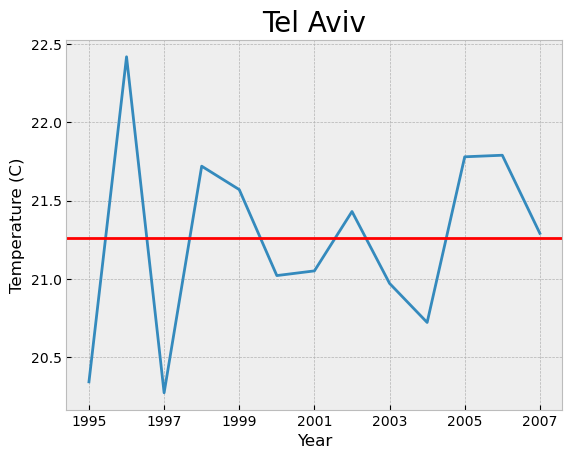

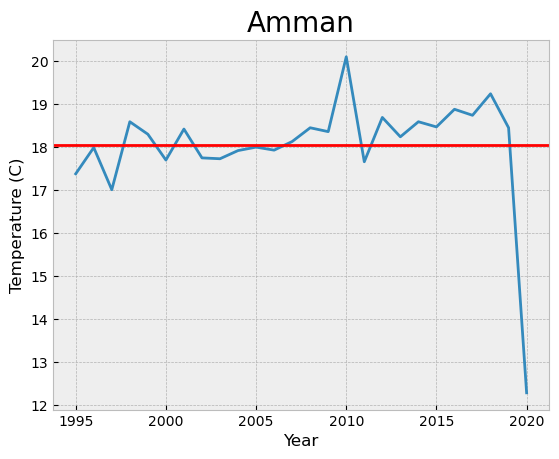

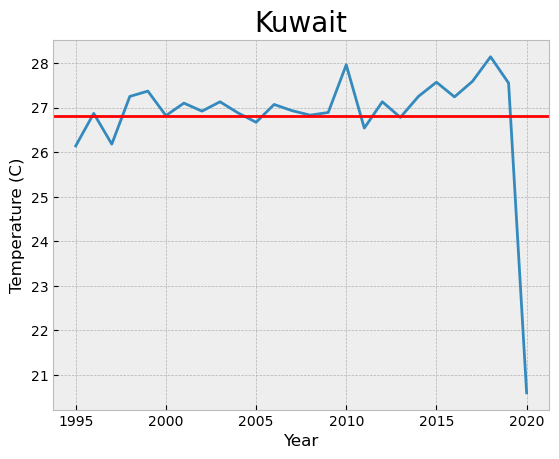

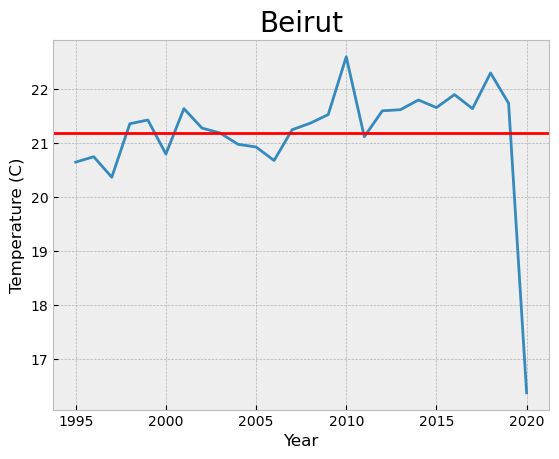

...

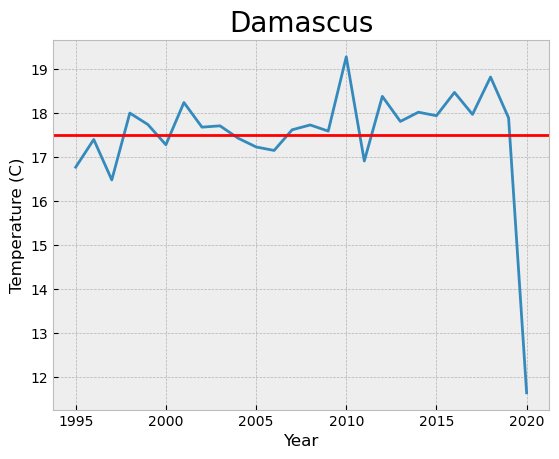

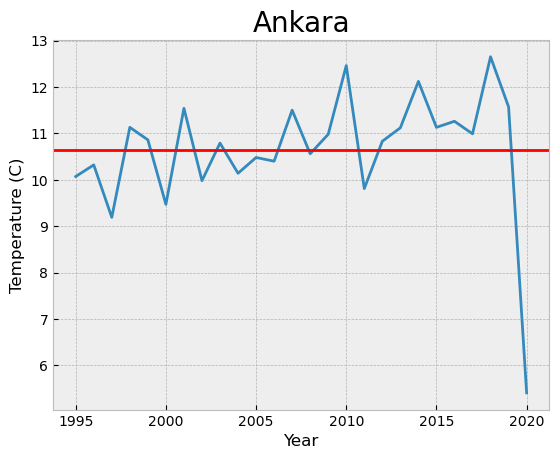

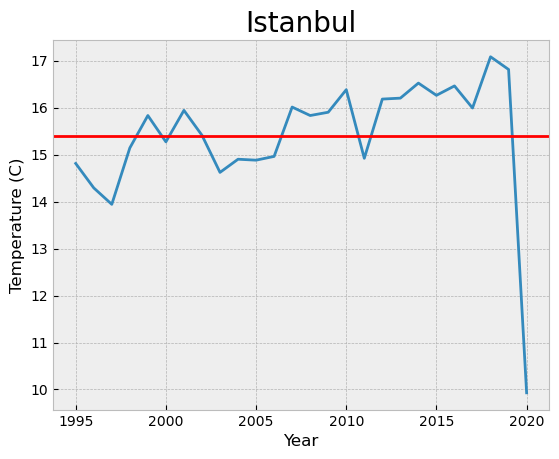

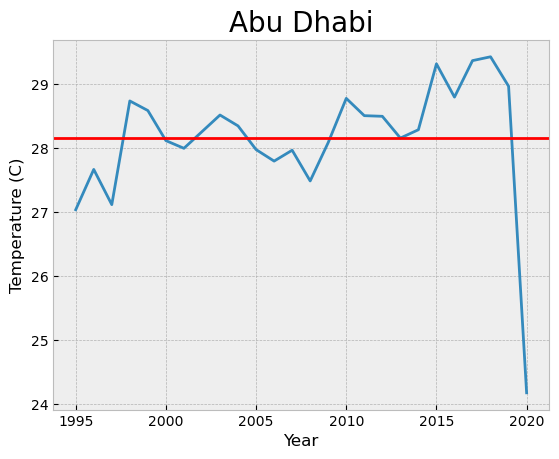

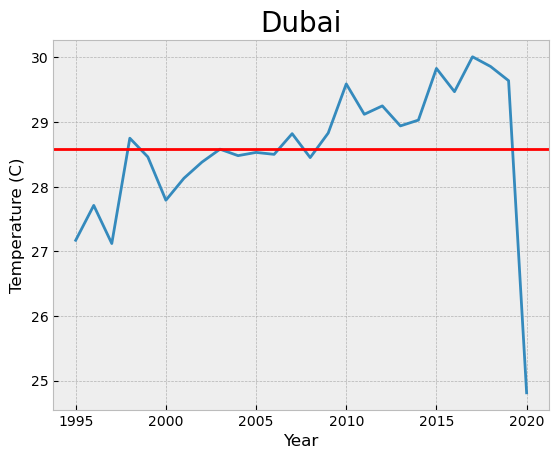

In [51]:
#DO NOT RUN AGAIN
#Save the Images for each specific City - Celsius
for column in middleeast_mean_c_df.columns[1:]:
    plt.style.use("bmh")
    middleeast_mean_c_df.plot(x = "Year", y = column)
    plt.axhline(round(middleeast_mean_c_df[column].mean(),2), color = "red")
    plt.title(column, fontsize = 20)
    plt.xlabel("Year")
    plt.ylabel("Temperature (C)")
    plt.legend().remove()
    plt.savefig(f"{column}_C.png", bbox_inches = "tight")

### Cleaning and Setting Up Data - South/Central America  & Carribean

In [52]:
#Importing Data
south_df = pd.read_csv("South_CentralAmerica_Carribean.csv")

#Reducing the Memory Load
south_df["Region"] = south_df["Region"].astype("category")
south_df["Month"]  = south_df["Month"].astype("category")
south_df["Year"]   = south_df["Year"].astype("category")
south_df["Day"]    = south_df["Day"].astype("category")
south_df["Country"]   = south_df["Country"].astype("category")

#First Glance
south_df.head()

,Region,Country,City,Month,Day,Year,AvgTemperature_F,AvgTemperature_C
0,South/Central America & Carribean,Argentina,Buenos Aires,1,1,1995,82.4,28.00
1,South/Central America & Carribean,Argentina,Buenos Aires,1,2,1995,75.1,23.94
2,South/Central America & Carribean,Argentina,Buenos Aires,1,3,1995,73.7,23.17
3,South/Central America & Carribean,Argentina,Buenos Aires,1,4,1995,77.1,25.06
4,South/Central America & Carribean,Argentina,Buenos Aires,1,5,1995,79.5,26.39


In [53]:
south_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 206691 entries, 0 to 206690
Data columns (total 8 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   Region            206691 non-null  category
 1   Country           206691 non-null  category
 2   City              206691 non-null  object  
 3   Month             206691 non-null  category
 4   Day               206691 non-null  category
 5   Year              206691 non-null  category
 6   AvgTemperature_F  206691 non-null  float64 
 7   AvgTemperature_C  206691 non-null  float64 
dtypes: category(5), float64(2), object(1)
memory usage: 5.7+ MB


In [55]:
#Guage the Total Satisfaction Level
year = []
leap_counter = 0

for i in range(1995,2021):
    year.append(i)
    
for i in year:
    if (i%4 == 0) and (i%100 != 0):
        leap_counter += 1
    elif (i%100 == 0) and (i%400 == 0):
        leap_counter += 1

total_days         = leap_counter*366 + (len(year)-leap_counter)*365
total_entries      = total_days * 25
recd_entries       = south_df.shape[0]
gap                = total_entries - 206691
data_efficiency    = round((gap/total_entries),2)

print(f'The total entries should be {total_entries}.')
print(f'The total entries recieved are {recd_entries}.')
print(f'The total gap in entries is {gap}.')

if data_efficiency < 0.075:
    print(f"Excellent Satisfaction Level. The Satisfaction Level is {data_efficiency}.")
elif 0.075 < data_efficiency <= 0.2:
    print(f"Satisfactory Satisfaction Level. The Satisfaction Level is {data_efficiency}.")
else:
    print(f"Satisfaction Level not met. The Satisfaction Level is {data_efficiency}.")

The total entries should be 237425.
The total entries recieved are 206691.
The total gap in entries is 30734.
Satisfactory Satisfaction Level. The Satisfaction Level is 0.13.


#### Country Wise Yearly Mean Temperature

In [56]:
#Create a List of Cities
south_city_list = south_df["City"].drop_duplicates().tolist()

#Create a List of Years
year = []
for i in range(1995,2021):
    year.append(i)

In [57]:
#Create a Dictionary for a Region - Fahrenheit
south_parent_dict_f = {}

for i in south_city_list:
    mydict = {}
    for j in year:
        x = round(south_df[(south_df["Year"] == j) & (south_df["City"] == i)]["AvgTemperature_F"].mean(),2)
        mydict[j] = x
    south_parent_dict_f[i] = mydict

#Create a Dictionary for a Region - Celsius
south_parent_dict_c = {}

for i in south_city_list:
    mydict = {}
    for j in year:
        x = round(south_df[(south_df["Year"] == j) & (south_df["City"] == i)]["AvgTemperature_C"].mean(),2)
        mydict[j] = x
    south_parent_dict_c[i] = mydict

print(south_parent_dict_f)
print(south_parent_dict_c)

{'Buenos Aires': {1995: 61.7, 1996: 62.71, 1997: 63.14, 1998: 61.76, 1999: 61.84, 2000: 62.4, 2001: 63.34, 2002: 63.01, 2003: 61.92, 2004: 62.63, 2005: 62.31, 2006: 62.69, 2007: 61.32, 2008: 63.36, 2009: 63.01, 2010: 63.01, 2011: 63.24, 2012: 63.73, 2013: 62.88, 2014: 63.61, 2015: 63.83, 2016: 62.19, 2017: 64.14, 2018: 63.47, 2019: 63.07, 2020: 69.98}, 'Nassau': {1995: 77.11, 1996: 76.03, 1997: 77.24, 1998: 78.08, 1999: 77.66, 2000: 77.38, 2001: 77.47, 2002: 78.96, 2003: 79.67, 2004: 78.26, 2005: 79.04, 2006: 78.77, 2007: 79.86, 2008: 79.53, 2009: 79.37, 2010: 78.25, 2011: 79.85, 2012: 78.62, 2013: 78.17, 2014: 78.61, 2015: 79.4, 2016: 79.34, 2017: 80.41, 2018: 79.07, 2019: 79.14, 2020: 75.59}, 'Hamilton': {1995: 71.29, 1996: 71.2, 1997: 71.25, 1998: 72.71, 1999: 72.62, 2000: 71.6, 2001: 71.11, 2002: 72.14, 2003: 72.5, 2004: 71.34, 2005: 71.23, 2006: 71.38, 2007: 70.85, 2008: 71.69, 2009: 72.08, 2010: 69.9, 2011: nan, 2012: nan, 2013: nan, 2014: nan, 2015: nan, 2016: nan, 2017: nan, 20

In [58]:
#Create a Database for Year v Country
#Fahrenheit
south_mean_f_df = pd.DataFrame.from_dict(south_parent_dict_f)

#Celsius
south_mean_c_df = pd.DataFrame.from_dict(south_parent_dict_c)

In [59]:
#DO NOT RUN AGAIN
#Adding Year column as String
#Fahrenheit
south_mean_f_df.insert(0, "Year", south_mean_f_df.index)
south_mean_f_df["Year"] = south_mean_f_df["Year"].astype(str)

#Celsius
south_mean_c_df.insert(0, "Year", south_mean_c_df.index)
south_mean_c_df["Year"] = south_mean_c_df["Year"].astype(str)

C:\Users\Amey Joshi\.conda\envs\pandas_playground\Lib\site-packages\pandas\plotting\_matplotlib\core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


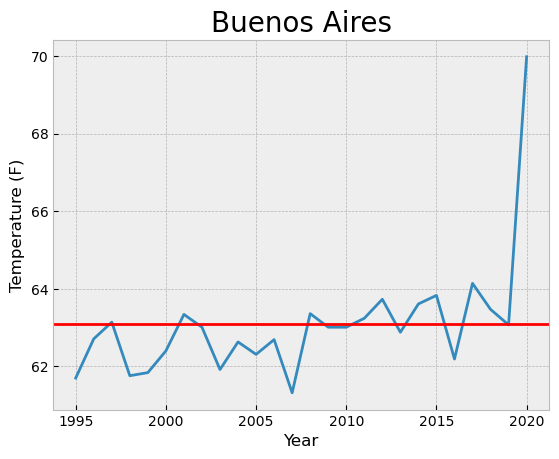

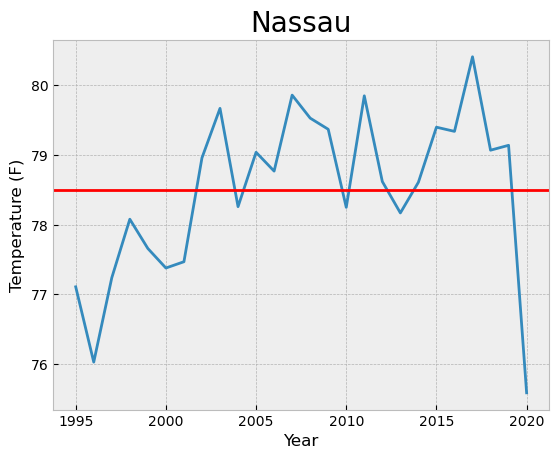

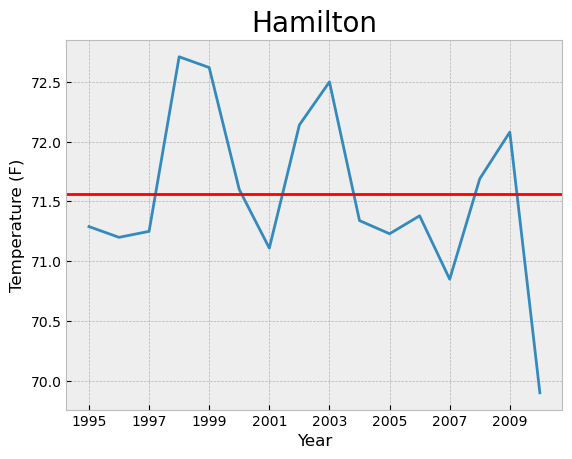

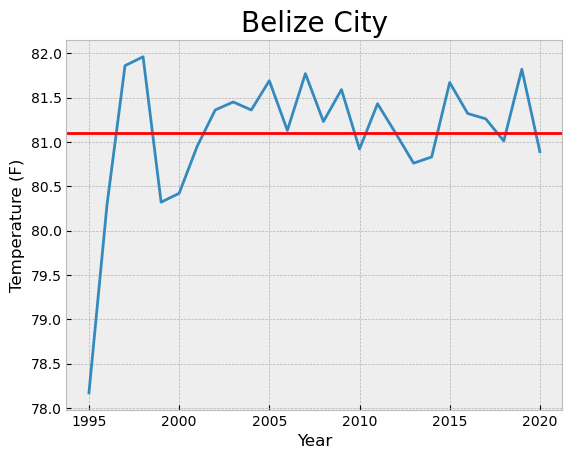

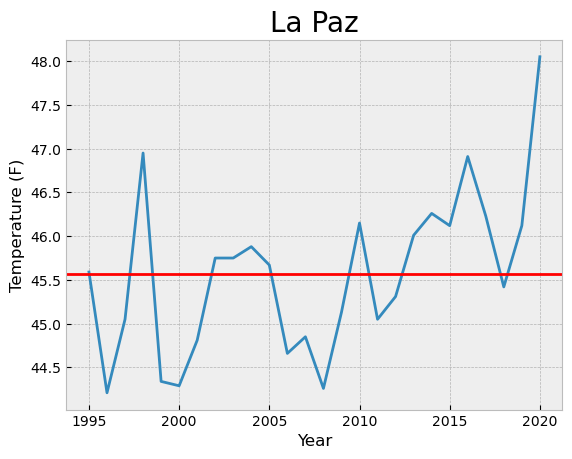

...

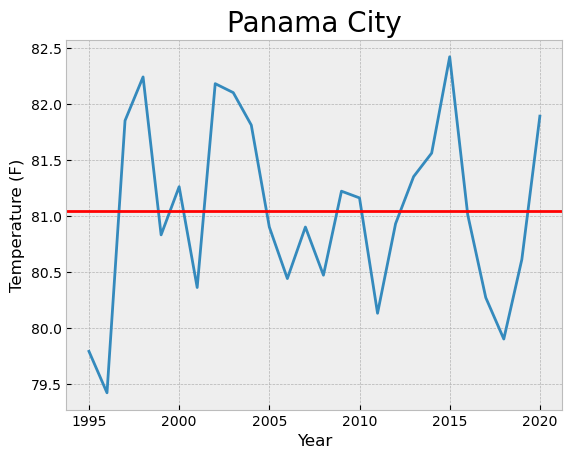

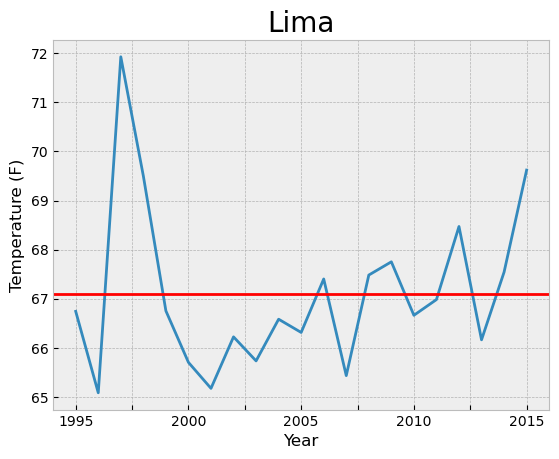

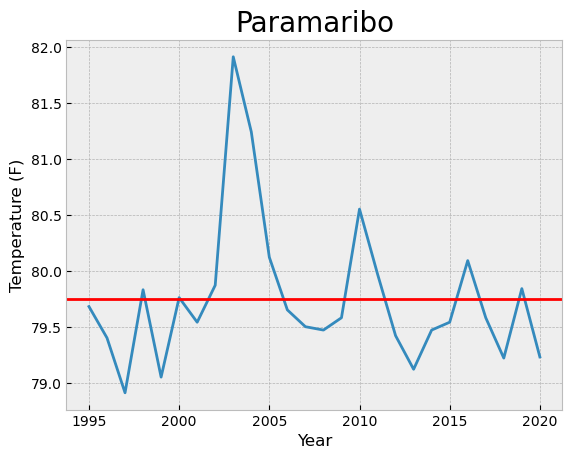

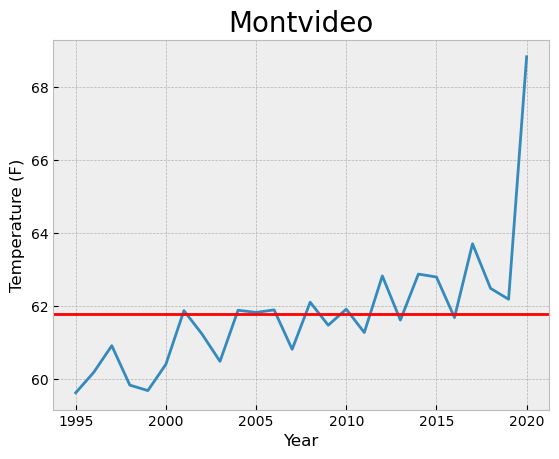

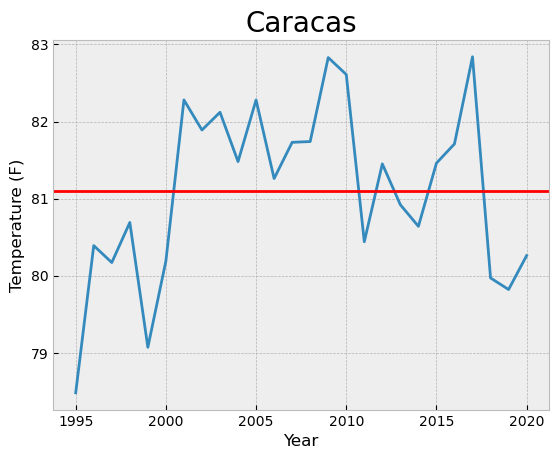

In [60]:
#DO NOT RUN AGAIN
#Save the Images for each specific City - Fahrenheit
for column in south_mean_f_df.columns[1:]:
    plt.style.use("bmh")
    south_mean_f_df.plot(x = "Year", y = column)
    plt.axhline(round(south_mean_f_df[column].mean(),2), color = "red")
    plt.title(column, fontsize = 20)
    plt.xlabel("Year")
    plt.ylabel("Temperature (F)")
    plt.legend().remove()
    plt.savefig(f"{column}_F.png", bbox_inches = "tight")

C:\Users\Amey Joshi\.conda\envs\pandas_playground\Lib\site-packages\pandas\plotting\_matplotlib\core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


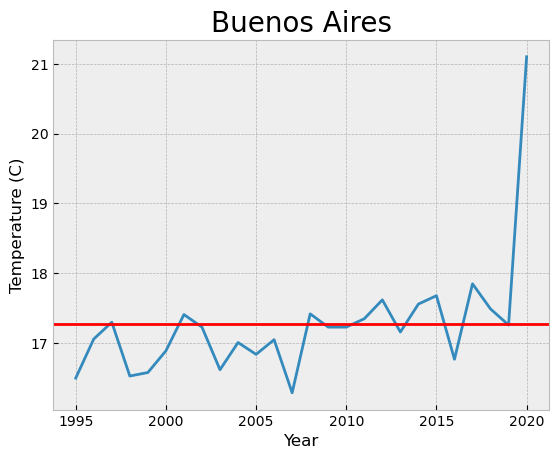

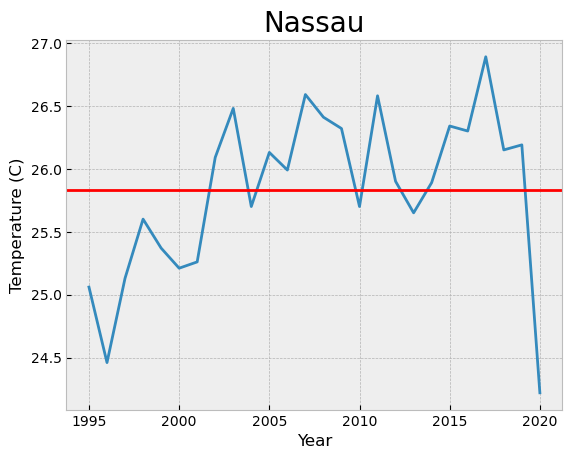

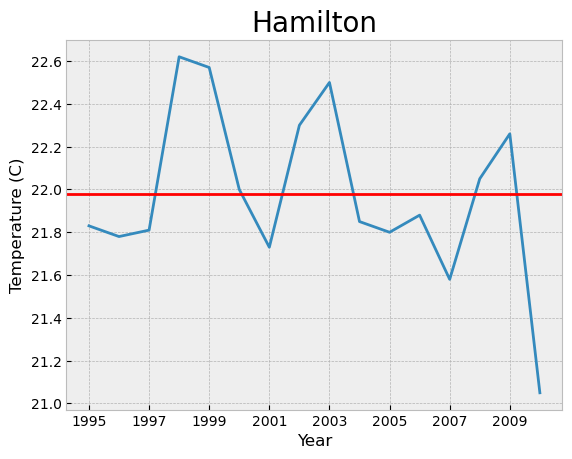

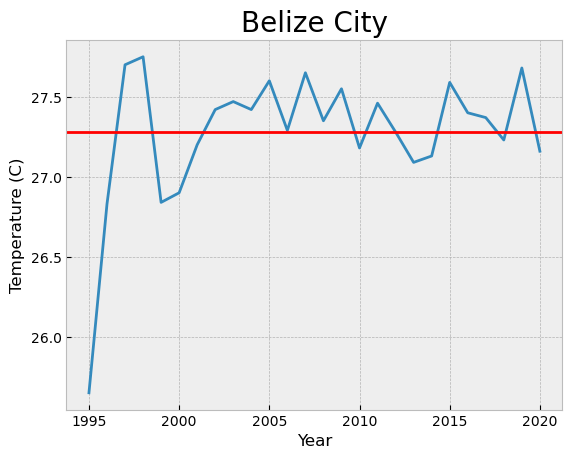

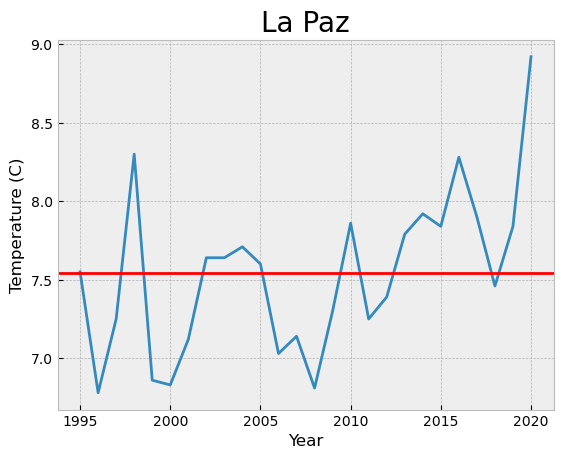

...

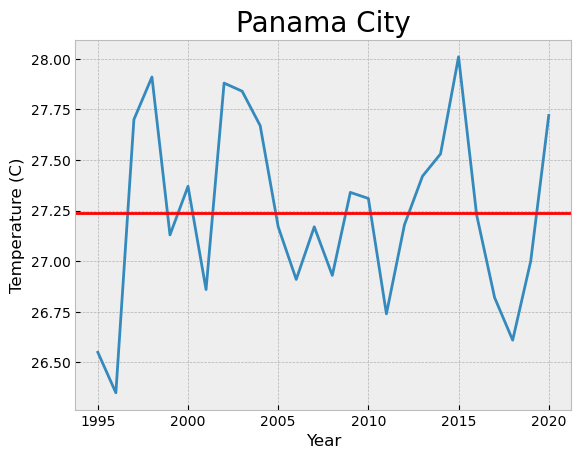

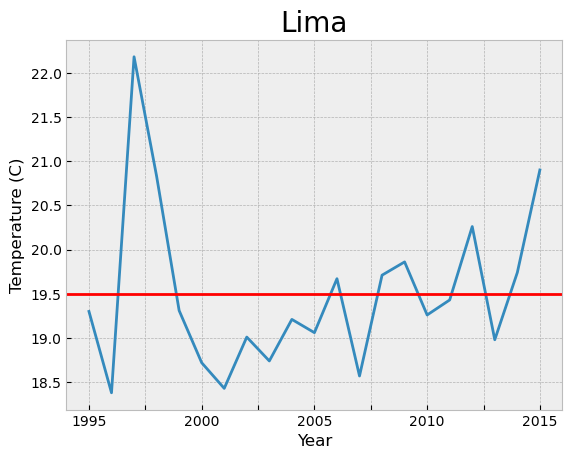

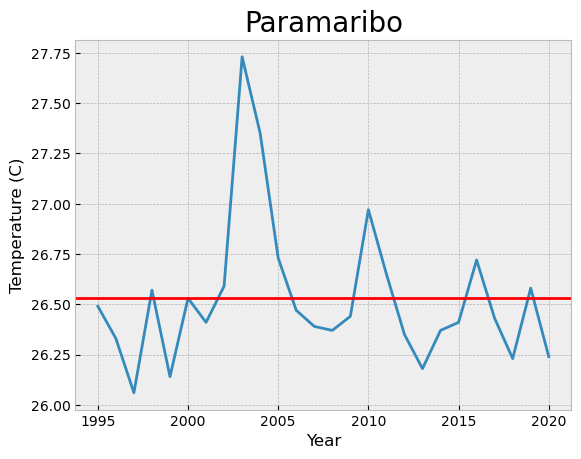

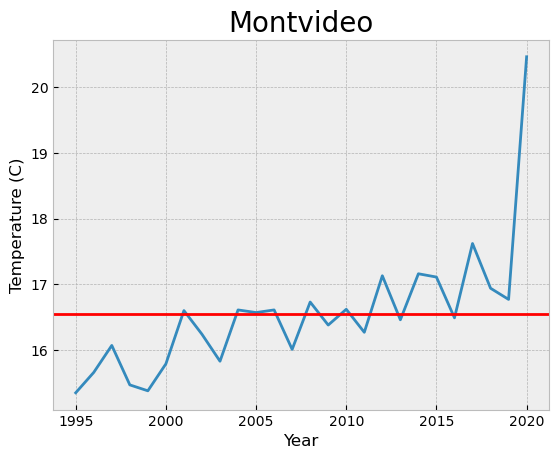

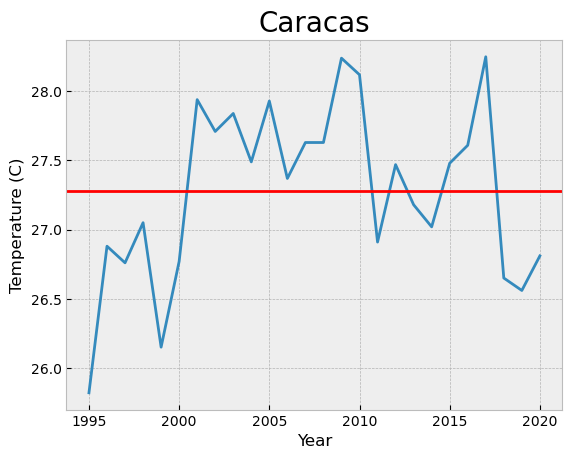

In [61]:
#DO NOT RUN AGAIN
#Save the Images for each specific City - Celsius
for column in south_mean_c_df.columns[1:]:
    plt.style.use("bmh")
    south_mean_c_df.plot(x = "Year", y = column)
    plt.axhline(round(south_mean_c_df[column].mean(),2), color = "red")
    plt.title(column, fontsize = 20)
    plt.xlabel("Year")
    plt.ylabel("Temperature (C)")
    plt.legend().remove()
    plt.savefig(f"{column}_C.png", bbox_inches = "tight")